MoveNet Data

In [1]:
import sys
import os 

from utils import *

In [2]:
# dataframe functions
def prep_df(csv_file):

    kp_df = read_movenet_kps(csv_file)
    kp_df = clean_keypoints(kp_df)
    kp_df = scale_movenet_keypoints(kp_df)
    kp_df = split_x_y(kp_df)

    return kp_df

def plot_df(kp_df, pose_vars, model_title, fig_size=(30, 30), plot_color='green'):

    fig, ax = plt.subplots(nrows=len(pose_vars), ncols=2, figsize=fig_size, layout='constrained')
    fig.suptitle(f'{model_title} coordinates over time', fontsize=30)

    for i in range(len(pose_vars)):
        ax[i,0].scatter(kp_df['time'].tolist(),kp_df[f'{pose_vars[i]}_X'].tolist(), color=plot_color)
        ax[i,0].set_xlabel('time (minutes)', fontsize=18)
        ax[i,0].set_ylabel(f'x coordinate', fontsize=18)
        # ax[i,0].set_ylim([0,480])
        ax[i,0].set_title(f'{pose_vars[i]} X', fontsize=25)

        ax[i,1].scatter(kp_df['time'].tolist(),kp_df[f'{pose_vars[i]}_Y'].tolist(), color=plot_color)
        ax[i,1].set_xlabel('time (minutes)', fontsize=18)
        ax[i,1].set_ylabel(f'y coordinate', fontsize=18)
        # ax[i,1].set_ylim([0,640])
        ax[i,1].set_title(f'{pose_vars[i]} Y', fontsize=25)

    return fig, ax

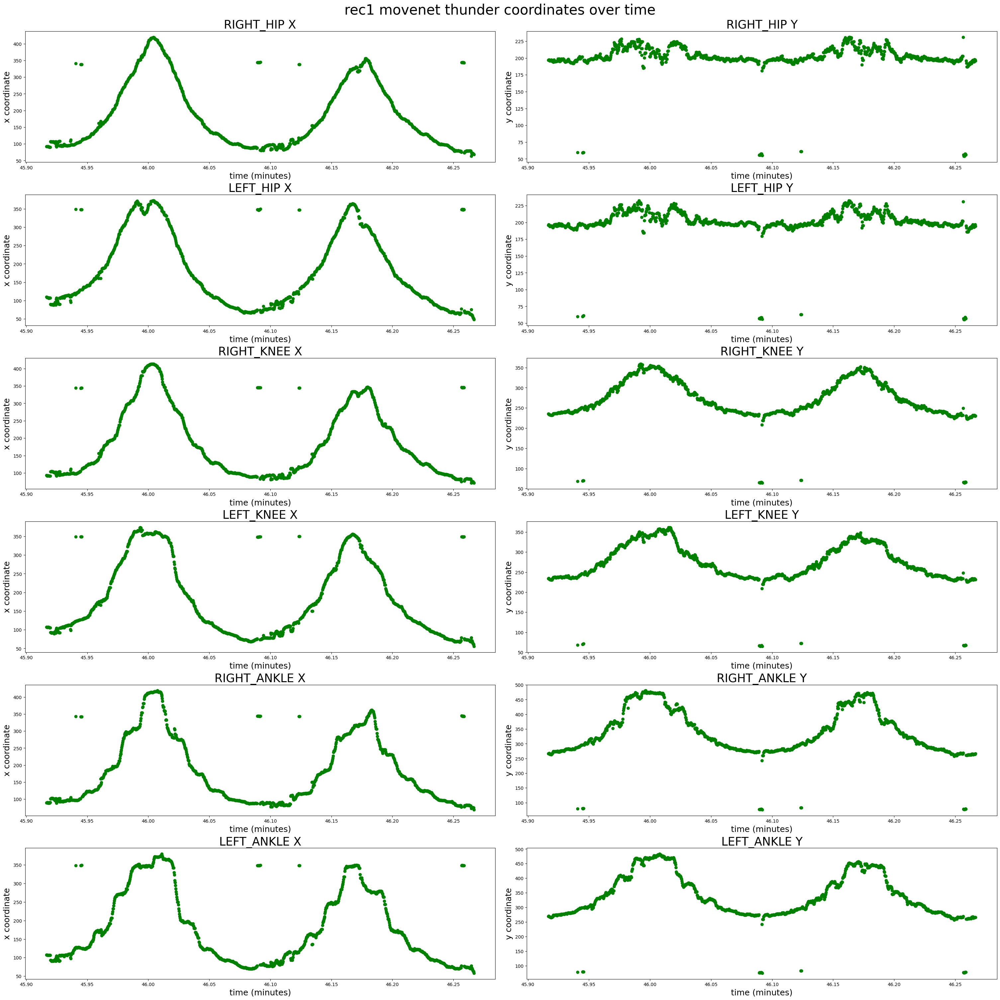

In [3]:
# plot some initial data
pose_vars = ['RIGHT_HIP', 'LEFT_HIP', 'RIGHT_KNEE', 'LEFT_KNEE', 'RIGHT_ANKLE', 'LEFT_ANKLE']
model_title = 'rec1 movenet thunder'

csv_file = 'keypoint_files/movenet/thunder/rec1_crop/movenet_rec1_crop_movenet_thunder_poses.csv'
kp_df = prep_df(csv_file)
plot_df(kp_df, pose_vars, model_title)
plt.show()

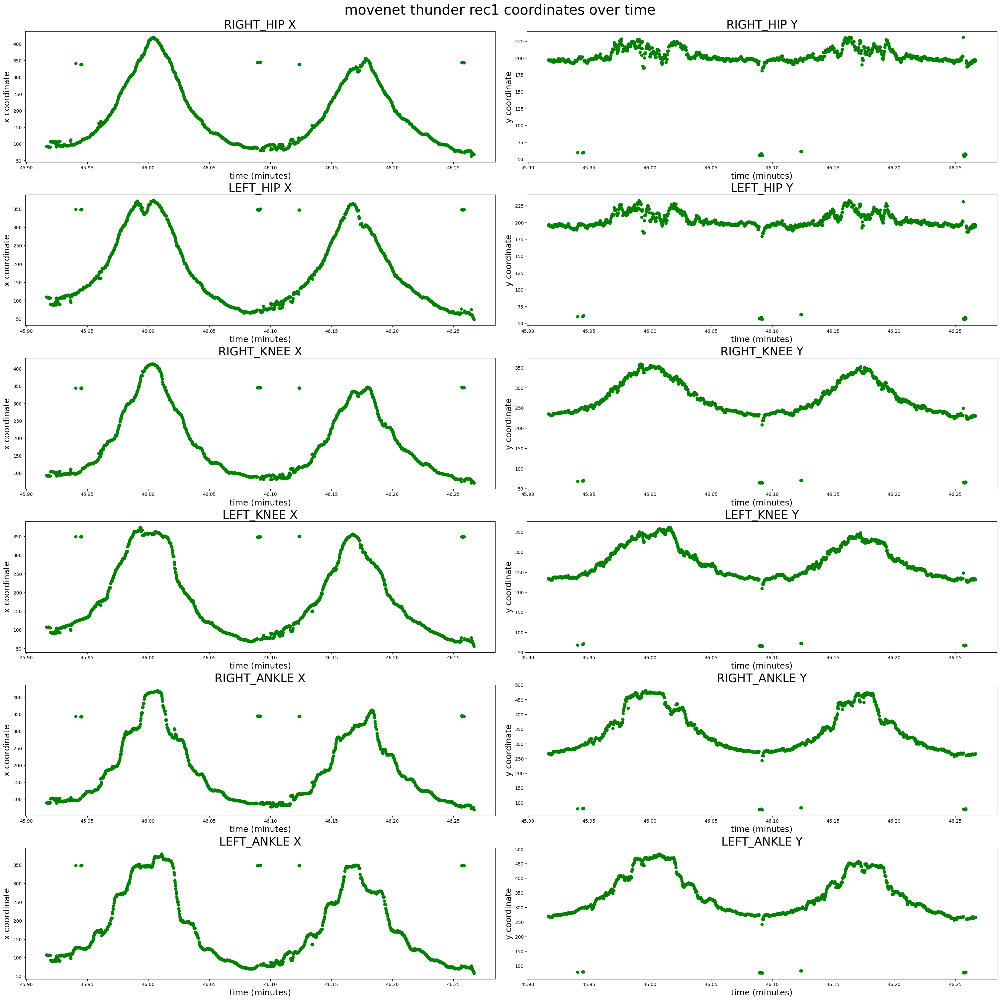

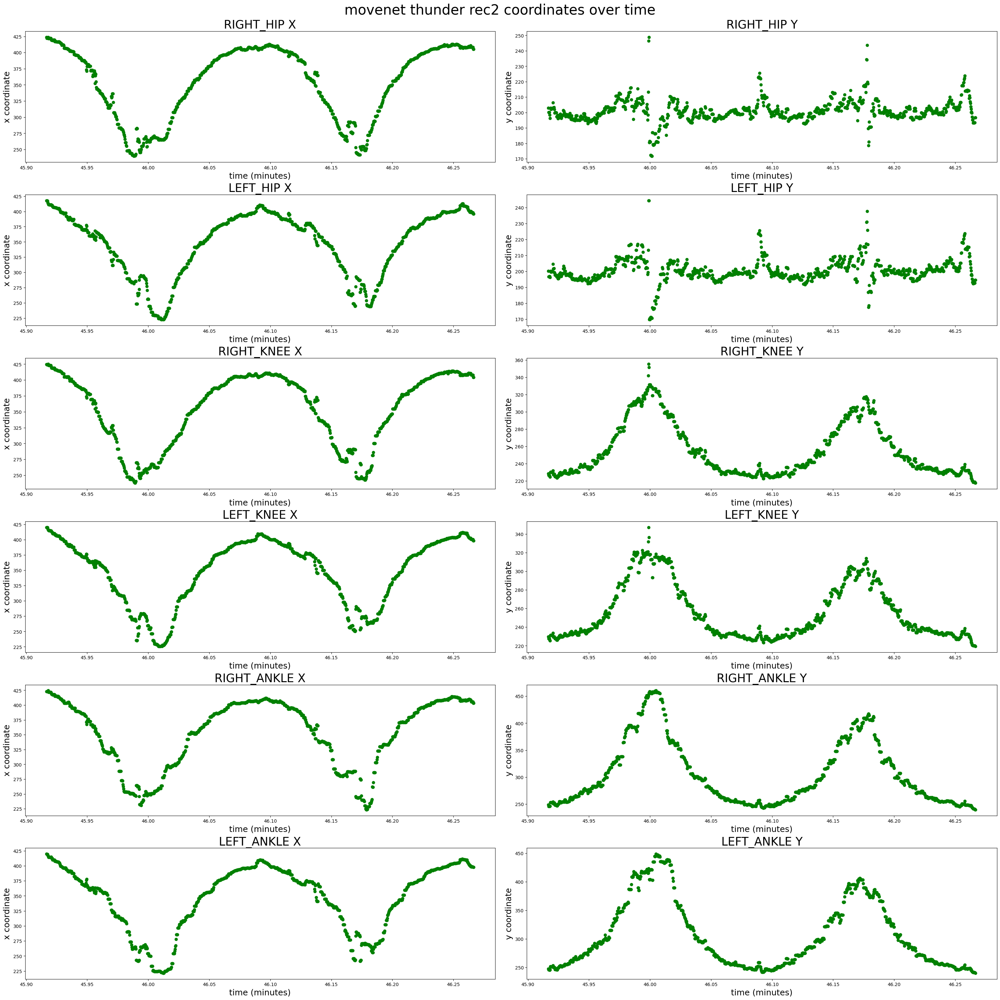

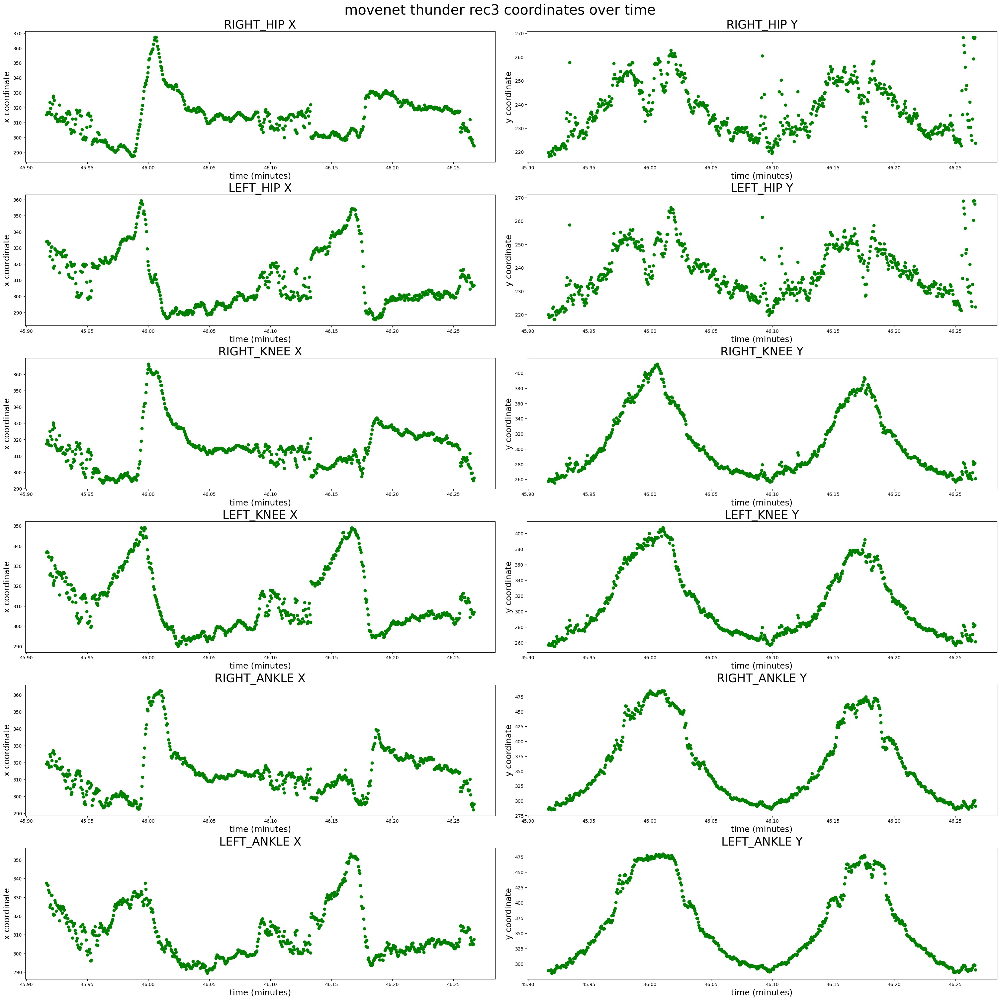

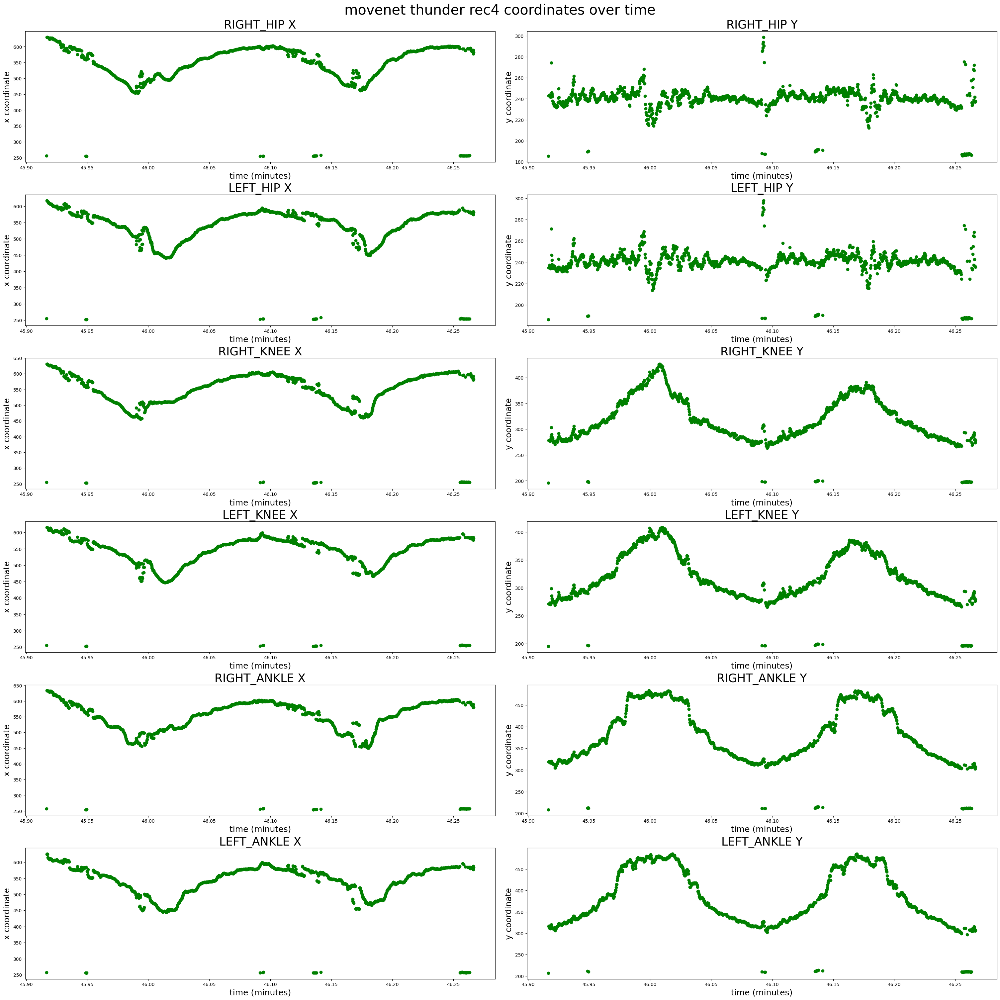

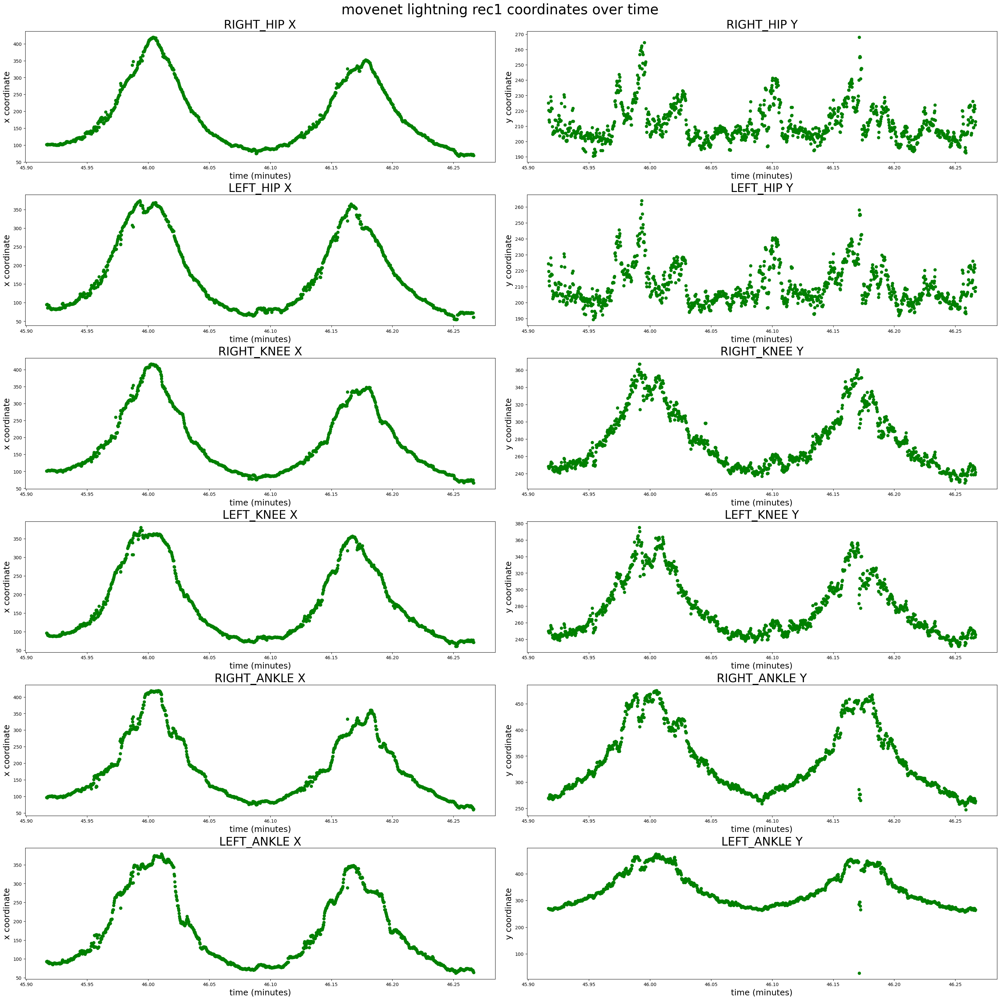

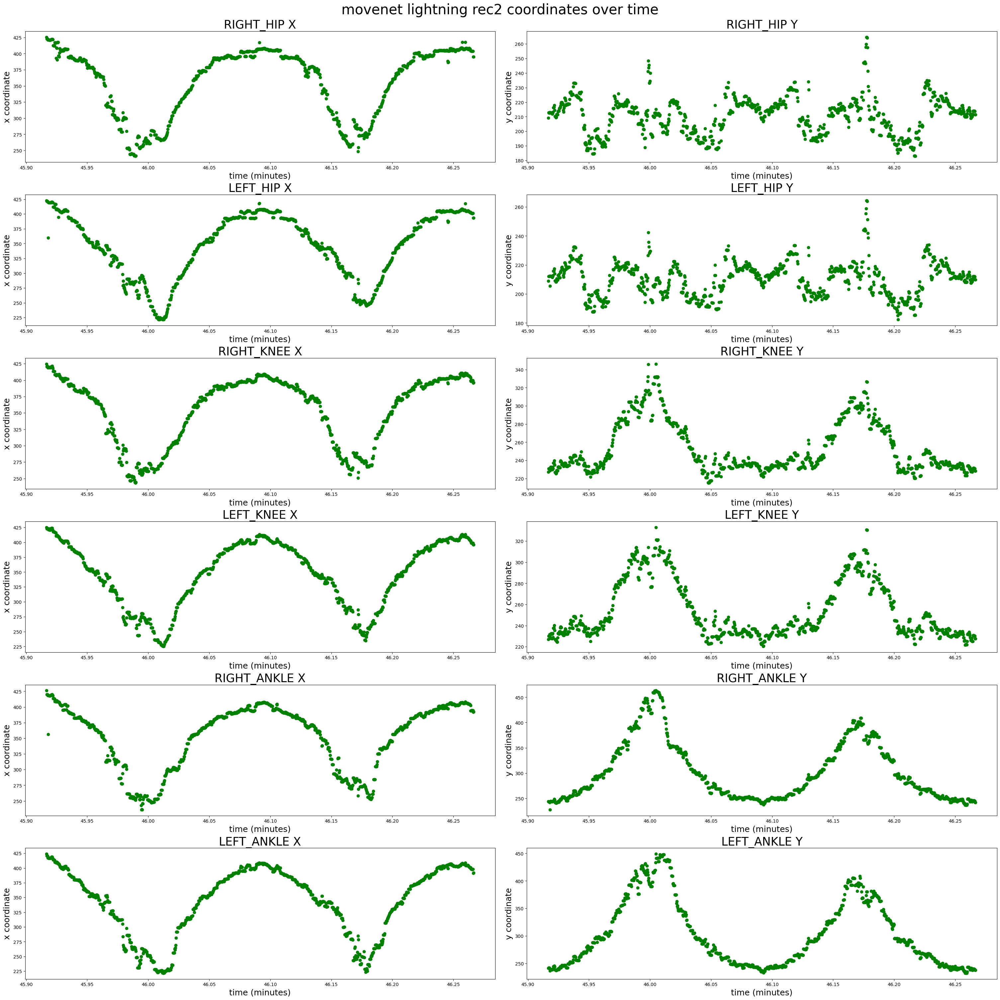

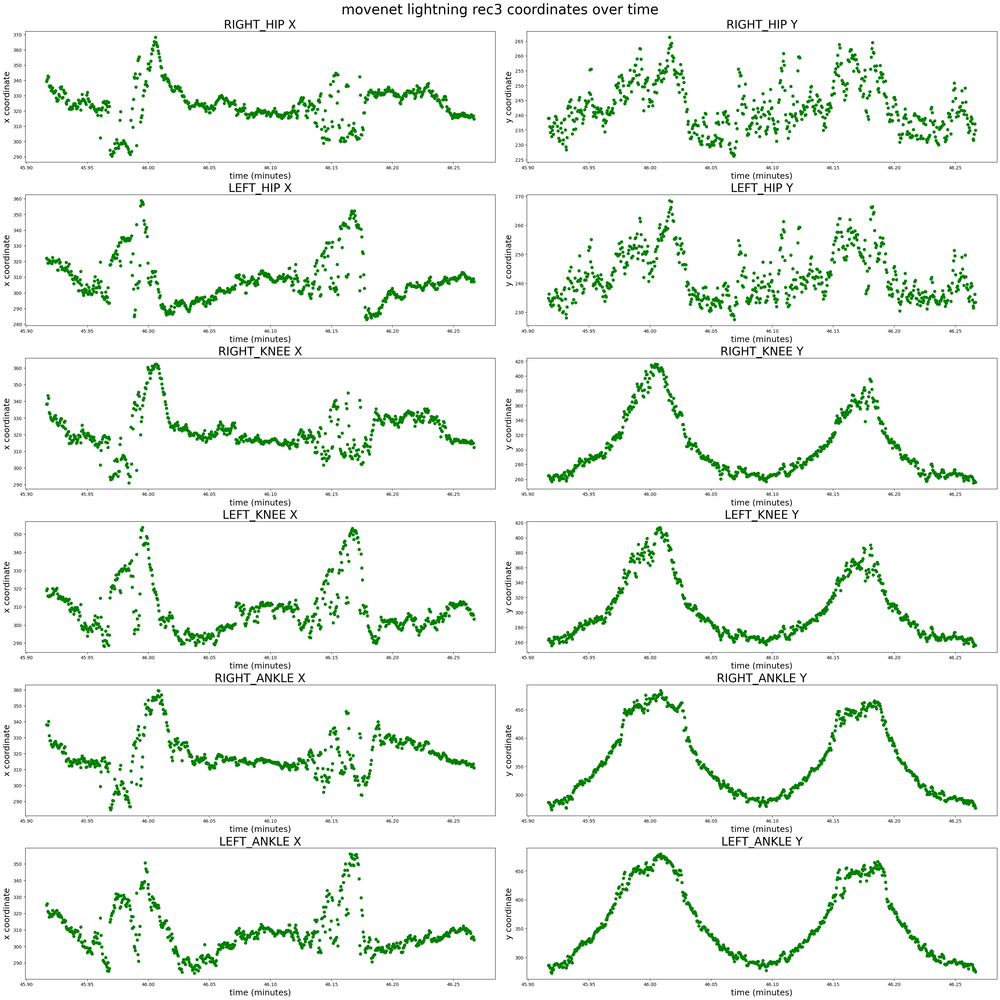

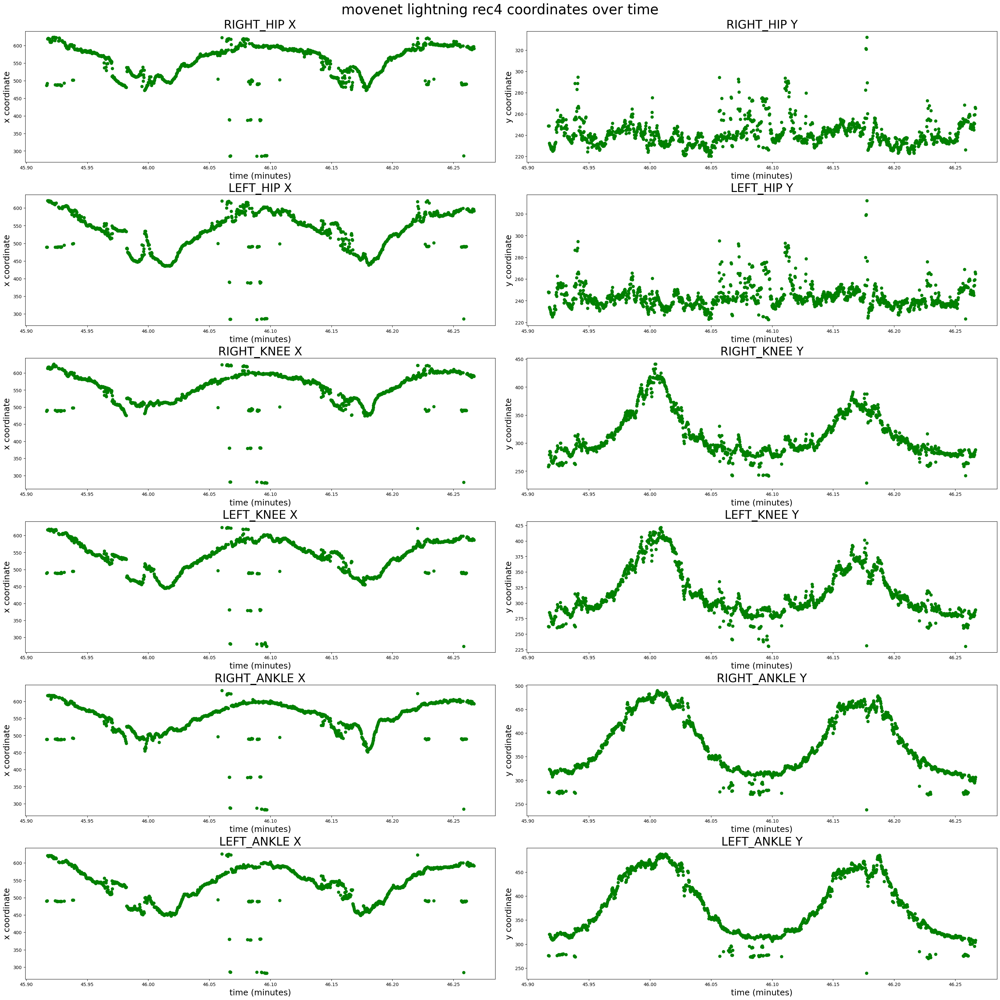

In [4]:
thunder_df1 = prep_df('keypoint_files/movenet/thunder/rec1_crop/movenet_rec1_crop_movenet_thunder_poses.csv')
thunder_df2 = prep_df('keypoint_files/movenet/thunder/rec2_crop/movenet_rec2_crop_movenet_thunder_poses.csv')
thunder_df3 = prep_df('keypoint_files/movenet/thunder/rec3_crop/movenet_rec3_crop_movenet_thunder_poses.csv')
thunder_df4 = prep_df('keypoint_files/movenet/thunder/rec4_crop/movenet_rec4_crop_movenet_thunder_poses.csv')

lightning_df1 = prep_df('keypoint_files/movenet/lightning/rec1_crop/movenet_rec1_crop_movenet_lightning_poses.csv')
lightning_df2 = prep_df('keypoint_files/movenet/lightning/rec2_crop/movenet_rec2_crop_movenet_lightning_poses.csv')
lightning_df3 = prep_df('keypoint_files/movenet/lightning/rec3_crop/movenet_rec3_crop_movenet_lightning_poses.csv')
lightning_df4 = prep_df('keypoint_files/movenet/lightning/rec4_crop/movenet_rec4_crop_movenet_lightning_poses.csv')

titles = ['movenet thunder rec1', 'movenet thunder rec2', 'movenet thunder rec3', 'movenet thunder rec4',
          'movenet lightning rec1', 'movenet lightning rec2', 'movenet lightning rec3', 'movenet lightning rec4']

df_list = [thunder_df1, thunder_df2, thunder_df3, thunder_df4, lightning_df1, lightning_df2, lightning_df3, lightning_df4]

pose_vars = ['RIGHT_HIP', 'LEFT_HIP', 'RIGHT_KNEE', 'LEFT_KNEE', 'RIGHT_ANKLE', 'LEFT_ANKLE']

for i in range(len(df_list)):
    plot_df(df_list[i], pose_vars, titles[i])
    plt.show()

Read in MCL Data

(following code is copied from the MCL_multiple_cameras_comparison notebook)

In [65]:
from utils import *

In [5]:
# MCL collected less keypoints, so plotting is slightly modified
mcl_keypoints = ['LEFT_ANKLE', 'LEFT_EAR', 'LEFT_SHOULDER', 'LEFT_HIP',
                'LEFT_KNEE', 'RIGHT_ANKLE', 'RIGHT_EAR', 'RIGHT_SHOULDER', 
                 'RIGHT_HIP', 'RIGHT_KNEE', 'COM']

kp_edges = ((1,6),(2,7),(2,3),(7,8),(3,8),(3,4),(8,9),(4,0),(9,5))

# time interval
time_int = [45 + (55.5/60), 46+(16.5/60)]

# origin of webcams in world coordinates
C1 = np.array([-.68, 2.66, 0.82])
C2 = np.array([-1.74, 3.43, 0.86])  
C3 = np.array([-2.66, 3.05, 0.84])  
C4 = np.array([-2.26, 3.26, 0.85])  

a1, a2, a3, a4 = 136, 180, 214, 200

# # read in MCL datasets
# # mcl_data = '../mcl experiments/mcl data/MCL_4_14/Global Points & CoM.txt'
# mcl_data = '../mcl_experiments/mcl_data/MCL_4_14/3d_MCL_points.csv'
# mcl_kp_df = pd.read_csv(mcl_data)
# mcl_kp_df = cleanup_mcl(mcl_kp_df)

Figuring out angles of rotation

In [6]:
import math

def angle_between_points(p1, p2):
  x1, y1 = p1
  x2, y2 = p2

  dx = x2 - x1
  dy = y2 - y1

  angle = math.atan2(dy, dx)
  angle = np.rad2deg(angle)

  return angle

print(a1, a2, a3, a4)
print(C1, C2, C3, C4)

C0 = np.array([0,0,0])
C0 = np.array([1,1,1])

print(angle_between_points(C0[:2], C1[:2]))
print(angle_between_points(C0[:2], C2[:2]))
print(angle_between_points(C0[:2], C3[:2]))
print(angle_between_points(C0[:2], C4[:2]))

a1_fix = angle_between_points(C0[:2], C1[:2])
a2_fix = angle_between_points(C0[:2], C2[:2])
a3_fix = angle_between_points(C0[:2], C3[:2])
a4_fix = angle_between_points(C0[:2], C4[:2])

136 180 214 200
[-0.68  2.66  0.82] [-1.74  3.43  0.86] [-2.66  3.05  0.84] [-2.26  3.26  0.85]
135.34308439952352
138.43142183685654
150.74640695967759
145.26830579801023


World2Cam transformation

(11, 3)
[[-0.96776404  0.25185861  0.          0.        ]
 [-0.25185861 -0.96776404  0.          0.        ]
 [ 0.          0.          1.          0.        ]]
(34,)
(3, 4)
all_coords1[0] shape  [-2.167448 -3.404195  0.093545]
(11, 3)
all_coords2[0] shape  [1.24020242 3.84034795 0.093545  ]


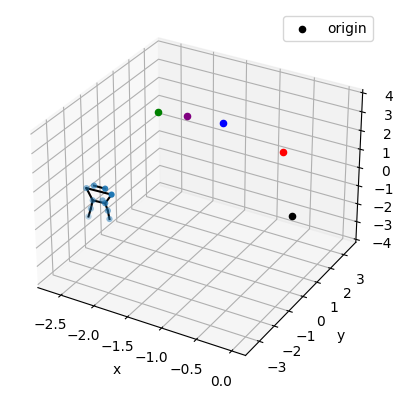

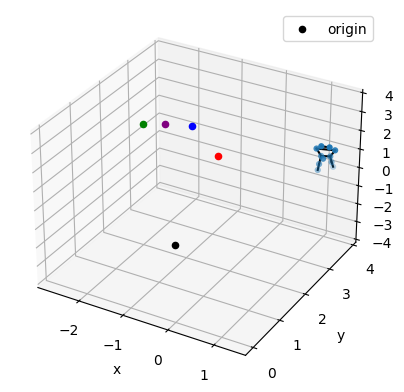

In [7]:
# original data 

mcl_data = '../mcl_experiments/mcl_data/MCL_4_14/3d_MCL_points.csv'
og_mcl = pd.read_csv(mcl_data)
og_mcl = cleanup_mcl(og_mcl, mcl_keypoints)
og_mcl = add_times(og_mcl, time_int)

def plot_pose(all_coords):
    x_coords, y_coords, z_coords = all_coords[:,0], all_coords[:,1], all_coords[:,2]

    fig = plt.figure()
    ax = fig.add_subplot(projection='3d')

    ax.scatter(x_coords, y_coords, z_coords, edgecolor='none')

    ax.scatter(C1[0], C1[1], C1[2], color='red')
    ax.scatter(C2[0], C2[1], C2[2], color='blue')
    ax.scatter(C3[0], C3[1], C3[2], color='green')
    ax.scatter(C4[0], C4[1], C4[2], color='purple')

    ax.scatter(0,0,0, color='black', label='origin')


    for i,j in kp_edges:
        xs, ys, zs = [x_coords[i], x_coords[j]], [y_coords[i], y_coords[j]], [z_coords[i], z_coords[j]]
        plt.plot(xs, ys, zs, color='black')

    ax.set_xlabel("x")
    ax.set_ylabel("y")
    ax.set_zlabel("z")
    ax.legend()

    # ax.view_init(elev=90, azim=-90)

    ax.set_zlim(-4,4)

pose1 = dict(og_mcl.iloc[1])

all_coords1 = np.array([pose1[kp] for kp in mcl_keypoints])

# RC = np.array([[1, 0, 0, -cam_origin[0]],
#                 [0, 1, 0, -cam_origin[1]],
#                 [0, 0, 1, -cam_origin[2]],])

angle = 0
cam_origin = np.array([0,0,0])
angle = a1_fix
c, s = np.cos(angle), np.sin(angle)
RC = np.array([[c, -s, 0, -cam_origin[0]],
                [s, c, 0, -cam_origin[1]],
                [0, 0, 1, -cam_origin[2]],])
print(all_coords1.shape)
print(RC)
print((np.append(all_coords1, 1)).shape)
print(RC.shape)
# all_coords_2 = all_coords1 @ RC

print("all_coords1[0] shape ", all_coords1[0])
all_coords2= np.array([RC@np.append(pose1[kp],1) for kp in mcl_keypoints])
print(all_coords2.shape)
print("all_coords2[0] shape ", all_coords2[0])



# c = np.cos(angle)
# s = np.sin(angle)
# # RC = np.array([[c, -s, 0, -cam_origin[0]],
# #                 [0, 0, 1, -cam_origin[1]],
# #                 [s, c, 0, -cam_origin[2]],])



# all_coords2 = np.array([P@np.append(pose1[kp],1) for kp in mcl_keypoints])
# print(RC[0])

plot_pose(all_coords1)
plt.show()
plot_pose(all_coords2)
plt.show()

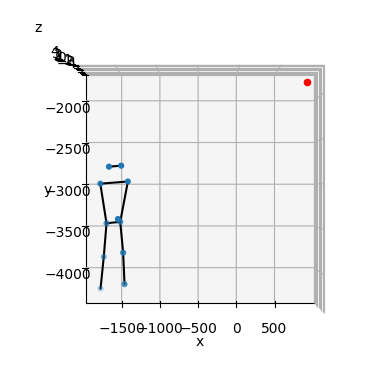

<Axes3D: xlabel='x', ylabel='y', zlabel='z'>

In [8]:
from mpl_toolkits.mplot3d import Axes3D


def world2cam(rot_angle, cam_origin, fx=967.186, fy=967.186, width=640, height=480):
    # world2cam transformation
    angle = np.radians(rot_angle) # make sure that this is in degrees
    c = np.cos(angle)
    s = np.sin(angle)
    # K = np.array([[fx, 0, 1],
    #               [0, fy, 1],
    #               [0, 0, 1],])
    K = np.array([[fx, 0, width/2],
                  [0, fy, height/2],
                  [0, 0, 1],])

    RC = np.array([[c, -s, 0, -cam_origin[0]],
                   [0, 0, 1, -cam_origin[1]],
                   [s, c, 0, -cam_origin[2]],])
    P = K @ RC
    return P

def mcl_plot_from_pose(kp_df, frame, rot_angle, cam_origin, plot_type='2D'):
    
    # P = world2cam(rot_angle, cam_origin)
    P = world2cam(rot_angle, cam_origin)

    pose = dict(kp_df.iloc[frame])
    all_coords = np.array([P@np.append(pose[kp],1) for kp in mcl_keypoints])
    # all_coords = np.array([world2cam(rot_angle, cam_origin, np.sqrt(pose[kp][0]**2+pose[kp][1]**2+pose[kp][2]**2))@np.append(pose[kp],1) for kp in mcl_keypoints])
    # all_coords = np.array([world2cam(rot_angle, cam_origin, fx=np.abs(pose[kp][0]), fy=np.abs(pose[kp][1]))@np.append(pose[kp],1) for kp in mcl_keypoints])
    # all_coords = np.array([world2cam(rot_angle, cam_origin, fx=640, fy=480)@np.append(pose[kp],1) for kp in mcl_keypoints])

    x_coords, y_coords, z_coords = all_coords[:,0], all_coords[:,1], all_coords[:,2]
    shifted_cam_origin = P @ np.append(cam_origin,1)

    s_c2 = P @ np.append(C2,1)
    s_c3 = P @ np.append(C3,1)
    s_c4 = P @ np.append(C4,1)
    
    if plot_type == '2D':
        fig = plt.figure()
        ax = fig.add_subplot()

        ax.scatter(x=x_coords, y=y_coords, edgecolor='none')
        ax.scatter(shifted_cam_origin[0], shifted_cam_origin[1], color='red')

        for i,j in kp_edges:
            plt.plot([x_coords[i], x_coords[j]], [y_coords[i], y_coords[j]], color='black')

        ax.set_xlabel("x")
        ax.set_ylabel("y") 
        # ax.set_xlim(-1000,1000)
        # ax.set_ylim(1500,2500)
    
    if plot_type == '3D':

        fig = plt.figure()
        ax = fig.add_subplot(projection='3d')

        ax.scatter(x_coords, y_coords, z_coords, edgecolor='none')

        ax.scatter(shifted_cam_origin[0], shifted_cam_origin[1], shifted_cam_origin[2], color='red')
        # ax.scatter(s_c2[0], s_c2[1], s_c2[2], color='black')
        # ax.scatter(s_c3[0], s_c3[1], s_c3[2], color='black')
        # ax.scatter(s_c4[0], s_c4[1], s_c4[2], color='black')

        for i,j in kp_edges:
            xs, ys, zs = [x_coords[i], x_coords[j]], [y_coords[i], y_coords[j]], [z_coords[i], z_coords[j]]
            plt.plot(xs, ys, zs, color='black')

        ax.set_xlabel("x")
        ax.set_ylabel("y")
        ax.set_zlabel("z")

        ax.view_init(elev=90, azim=-90)

        ax.set_zlim(-4,4)

    plt.show()
    return ax

mcl_data = '../mcl_experiments/mcl_data/MCL_4_14/3d_MCL_points.csv'
og_mcl = pd.read_csv(mcl_data)
og_mcl = cleanup_mcl(og_mcl, mcl_keypoints)
og_mcl = add_times(og_mcl, time_int)

mcl_plot_from_pose(og_mcl, 1, 0, C2, plot_type='3D')
# mcl_plot_from_pose(og_mcl, 1000, 180, C2, plot_type='3D')
# mcl_plot_from_pose(og_mcl, 2000, 180, C2, plot_type='3D')

# mcl_plot_from_pose(og_mcl, 1, 180, C2, plot_type='2D')
# mcl_plot_from_pose(og_mcl, 1000, 180, C2, plot_type='2D')
# mcl_plot_from_pose(og_mcl, 1100, 180, C2, plot_type='2D')
# mcl_plot_from_pose(og_mcl, 1200, 180, C2, plot_type='2D')

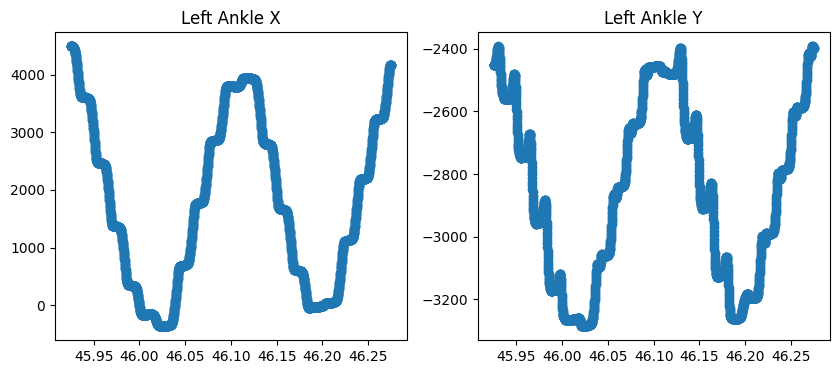

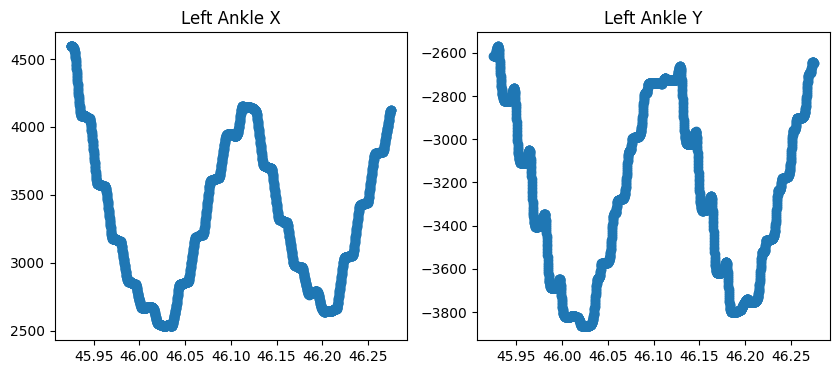

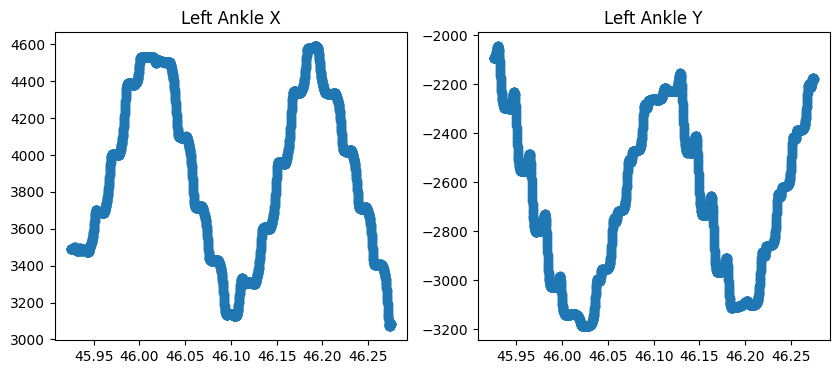

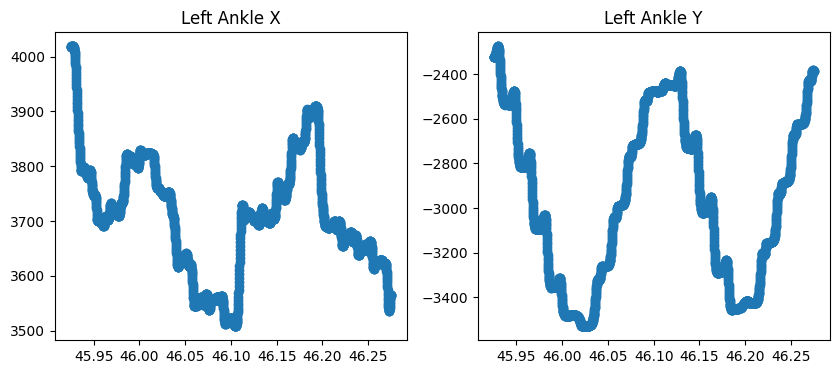

In [9]:
def plot_angle_test(df, angle, coord, P):
    P = world2cam(angle, coord)
    for keypoint in mcl_keypoints:
        df[keypoint] = df[keypoint].apply(lambda x: P@np.append(x,1))
    
    df = add_xyz(df)

    fig, ax = plt.subplots(1,2, figsize=(10,4))
    
    ax[0].scatter(df['time'], df['LEFT_ANKLE_X'])
    ax[0].set_title('Left Ankle X')
    # plt.show()
    ax[1].scatter(df['time'], df['LEFT_ANKLE_Y'])
    ax[1].set_title('Left Ankle Y')
    plt.show()

P = world2cam(a3, C3)
test_mcl = og_mcl.copy()

plot_angle_test(og_mcl.copy(), a1, C1, P)
plot_angle_test(og_mcl.copy(), a2, C2, P)
plot_angle_test(og_mcl.copy(), a3, C3, P)
plot_angle_test(og_mcl.copy(), a4, C4, P)

In [10]:
og_mcl.head()

,LEFT_ANKLE,LEFT_EAR,LEFT_SHOULDER,LEFT_HIP,LEFT_KNEE,RIGHT_ANKLE,RIGHT_EAR,RIGHT_SHOULDER,RIGHT_HIP,RIGHT_KNEE,COM,time,time_int
0,"[-2.167679, -3.404607, 0.093622]","[-2.149428, -3.112124, 1.530369]","[-2.248672, -3.168134, 1.334083]","[-2.139528, -3.246696, 0.863245]","[-2.152184, -3.318901, 0.465575]","[-1.907154, -3.207518, 0.100273]","[-1.985256, -3.108453, 1.542229]","[-1.887295, -3.131303, 1.352259]","[-1.965105, -3.211185, 0.873145]","[-1.938428, -3.168735, 0.481281]","[-2.027335, -3.111607, 0.882573]",45.925000,45.925000
1,"[-2.167448, -3.404195, 0.093545]","[-2.147511, -3.108949, 1.529894]","[-2.246868, -3.163717, 1.333483]","[-2.137911, -3.243097, 0.862478]","[-2.151248, -3.317202, 0.465103]","[-1.906624, -3.204582, 0.099659]","[-1.983416, -3.10586, 1.541795]","[-1.885302, -3.129901, 1.351926]","[-1.963256, -3.208871, 0.872808]","[-1.937048, -3.167875, 0.480909]","[-2.025943, -3.108902, 0.882059]",45.925139,45.925139
2,"[-2.167243, -3.403817, 0.093489]","[-2.145459, -3.105599, 1.529378]","[-2.244939, -3.159089, 1.332835]","[-2.136161, -3.239285, 0.861643]","[-2.150275, -3.315348, 0.464585]","[-1.906059, -3.201654, 0.098964]","[-1.98143, -3.103115, 1.541315]","[-1.883168, -3.128401, 1.351548]","[-1.961277, -3.206387, 0.87242]","[-1.935609, -3.167022, 0.480471]","[-2.024447, -3.106027, 0.88149]",45.925278,45.925278
3,"[-2.167077, -3.403492, 0.093469]","[-2.143279, -3.102119, 1.528822]","[-2.242889, -3.154322, 1.332143]","[-2.134278, -3.235301, 0.860743]","[-2.149276, -3.313334, 0.464024]","[-1.905464, -3.198844, 0.098185]","[-1.979301, -3.100249, 1.540791]","[-1.880909, -3.126811, 1.351121]","[-1.959175, -3.203744, 0.871971]","[-1.934133, -3.166201, 0.479959]","[-2.022852, -3.103016, 0.880867]",45.925417,45.925417
4,"[-2.16696, -3.403234, 0.093503]","[-2.140976, -3.098543, 1.52823]","[-2.240721, -3.149479, 1.331408]","[-2.132262, -3.231182, 0.859782]","[-2.148257, -3.311154, 0.463421]","[-1.904848, -3.196244, 0.097332]","[-1.977035, -3.097288, 1.540224]","[-1.878532, -3.125139, 1.350642]","[-1.956954, -3.200953, 0.871456]","[-1.932633, -3.165431, 0.47937]","[-2.021157, -3.099897, 0.880191]",45.925556,45.925556


In [72]:

# test_df = mcl_kp_df.copy()
# time_int = [45 + (55.5/60), 46+(16.5/60)]
# test_df = add_times(test_df, time_int)

# mcl_1, mcl_2, mcl_3, mcl_4 = test_df.copy(), test_df.copy(), test_df.copy(), test_df.copy()

# # origin of camera in world coordinates
# C1 = np.array([-.68, 2.66, 0.82])
# C2 = np.array([-1.74, 3.43, 0.86])  
# C3 = np.array([-2.66, 3.05, 0.84])  
# C4 = np.array([-2.26, 3.26, 0.85])  

# a1, a2, a3, a4 = 136, 180, 214, 200

# mcl_1 = transform_df(mcl_1, C1, a1)
# mcl_2 = transform_df(mcl_2, C2, a2)
# mcl_3 = transform_df(mcl_3, C3, a3)
# mcl_4 = transform_df(mcl_4, C4, a4)

# og_mcl = mcl_kp_df.copy()
# og_mcl = add_times(og_mcl, time_int)
# og_mcl = add_xyz(og_mcl)

# # temporary: 
# plot_vars = ['RIGHT_HIP', 'LEFT_HIP']

# # df1, df2, df3 = mcl_1.copy(), thunder_df1.copy(), lightning_df1.copy()
# # df1, df2, df3 = prep_plot_dfs(df1, df2, df3, plot_vars)
# # models_compare(df1, df2, df3, plot_vars, plot_title='CAM1 Models Comparison')

# df1, df2, df3 = mcl_2.copy(), thunder_df2.copy(), lightning_df2.copy()
# df1, df2, df3 = prep_plot_dfs(df1, df2, df3, plot_vars)
# models_compare(df1, df2, df3, plot_vars, plot_title='CAM2 Models Comparison')

# # df1, df2, df3 = mcl_3.copy(), thunder_df3.copy(), lightning_df3.copy()
# # df1, df2, df3 = prep_plot_dfs(df1, df2, df3, plot_vars)
# # models_compare(df1, df2, df3, plot_vars, plot_title='CAM3 Models Comparison')

# # df1, df2, df3 = mcl_4.copy(), thunder_df4.copy(), lightning_df4.copy()
# # df1, df2, df3 = prep_plot_dfs(df1, df2, df3, plot_vars)
# # models_compare(df1, df2, df3, plot_vars, plot_title='CAM4 Models Comparison')



In [73]:
# plt.scatter(mcl_1['time'], mcl_1['RIGHT_HIP_X'])

In [74]:
# titles = ['MCL OG', 'MCL rec1', 'MCL rec2', 'MCL rec3', 'MCL rec4']
# df_list = [og_mcl, mcl_1, mcl_2, mcl_3, mcl_4]
# pose_vars = ['RIGHT_HIP', 'LEFT_HIP', 'RIGHT_KNEE', 'LEFT_KNEE', 'RIGHT_ANKLE', 'LEFT_ANKLE']
# # plot_df(test_df, pose_vars, 'test rotation', plot_color='tab:blue')
# for i in range(len(df_list)):
#     plot_df(df_list[i], pose_vars, titles[i], plot_color='tab:blue')
#     plt.show()

In [75]:
# # pose_vars = ['RIGHT_HIP', 'LEFT_HIP', 'RIGHT_KNEE', 'LEFT_KNEE', 'RIGHT_ANKLE', 'LEFT_ANKLE']
# pose_vars = ['RIGHT_HIP', 'LEFT_HIP']
# model_title = 'movenet thunder rec1'

# clean_df = kp_df.copy()

# # Calculate the difference between the values in the column
# diff = clean_df['LEFT_KNEE_Y'].diff()
# # Filter the rows that have the same value as the previous row
# clean_df = clean_df[(diff < .1)&(diff > -.1)]
# clean_df = clean_df[clean_df['RIGHT_HIP_Y']>100]

# plot_df(kp_df, pose_vars, model_title, fig_size=(20,15))
# plt.ylim(0,480)
# plt.show()

# plot_df(clean_df, pose_vars, model_title, fig_size=(20,15))
# plt.ylim(0,480)
# plt.show()


## Compare MCL with MoveNets

Compare MCL with another dataframe

In [76]:
# plot_var = 'LEFT_ANKLE'

# df1 = mcl_1.copy()
# df2 = thunder_df1.copy()
# df3 = lightning_df1.copy()

# # time correction
# time_int = [45 + (55.0/60), 46+(14.9/60)]
# df1 = add_times(df1, time_int)

# # manually remove the outliers
# df2 = df2[df2['RIGHT_HIP_Y']>100]
# df3 = df3[df3['RIGHT_HIP_Y']>100]

# df1 = normalize_df(df1, f'{plot_var}_X', f'{plot_var}_Y')
# df2 = normalize_df(df2, f'{plot_var}_X', f'{plot_var}_Y')
# df3 = normalize_df(df3, f'{plot_var}_X', f'{plot_var}_Y')

# plt.scatter(df1['time'], df1[f'{plot_var}_X'], color='black')
# plt.scatter(df2['time'], df2[f'{plot_var}_X'], color='green', alpha=.5)
# plt.scatter(df3['time'], df3[f'{plot_var}_X'], color='red', alpha=.5)
# plt.show()

# plt.scatter(df1['time'], df1[f'{plot_var}_Y'], color='black')
# plt.scatter(df2['time'], df2[f'{plot_var}_Y'], color='green', alpha=.5)
# plt.scatter(df3['time'], df3[f'{plot_var}_Y'], color='red', alpha=.5)
# plt.show()

## Sanity Check MCL Ground Truths

In [77]:
# print(mcl_1.keys())
# print(keypoints)
# print(num_edges)

# # mcl_keypoints = ['LEFT_ANKLE', 'LEFT_EAR', 'LEFT_SHOULDER', 'LEFT_HIP', 'LEFT_KNEE',
# #        'RIGHT_ANKLE', 'RIGHT_EAR', 'RIGHT_SHOULDER', 'RIGHT_HIP', 'RIGHT_KNEE',
# #      #   'LEFT_ANKLE_X', 'LEFT_ANKLE_Y',
# #      #   'LEFT_ANKLE_Z', 'LEFT_EAR_X', 'LEFT_EAR_Y', 'LEFT_EAR_Z',
# #      #   'LEFT_SHOULDER_X', 'LEFT_SHOULDER_Y', 'LEFT_SHOULDER_Z', 'LEFT_HIP_X',
# #      #   'LEFT_HIP_Y', 'LEFT_HIP_Z', 'LEFT_KNEE_X', 'LEFT_KNEE_Y', 'LEFT_KNEE_Z',
# #        ]

# for kp in keypoints:
#        if kp not in mcl_keypoints: print(kp)

In [78]:


# for keypoint in mcl_keypoints:
#     test_mcl[keypoint] = test_mcl[keypoint].apply(lambda x: P@np.append(x,1))

# test_mcl = add_xyz(test_mcl)

# test_mcl['frame'] = np.linspace(0, len(test_mcl)-1, len(test_mcl)).astype(int)

# plt.scatter(test_mcl['frame'], test_mcl['LEFT_ANKLE_X'])
# plt.title('Left Ankle X')
# plt.show()
# plt.scatter(test_mcl['frame'], test_mcl['LEFT_ANKLE_Y'])
# plt.title('Left Ankle Y')
# # plt.ylim(1500,2000)
# plt.show()

In [79]:
test_mcl.head()

,LEFT_ANKLE,LEFT_EAR,LEFT_SHOULDER,LEFT_HIP,LEFT_KNEE,RIGHT_ANKLE,RIGHT_EAR,RIGHT_SHOULDER,RIGHT_HIP,RIGHT_KNEE,COM,time,time_int
0,"[-2.167679, -3.404607, 0.093622]","[-2.149428, -3.112124, 1.530369]","[-2.248672, -3.168134, 1.334083]","[-2.139528, -3.246696, 0.863245]","[-2.152184, -3.318901, 0.465575]","[-1.907154, -3.207518, 0.100273]","[-1.985256, -3.108453, 1.542229]","[-1.887295, -3.131303, 1.352259]","[-1.965105, -3.211185, 0.873145]","[-1.938428, -3.168735, 0.481281]","[-2.027335, -3.111607, 0.882573]",45.925000,45.925000
1,"[-2.167448, -3.404195, 0.093545]","[-2.147511, -3.108949, 1.529894]","[-2.246868, -3.163717, 1.333483]","[-2.137911, -3.243097, 0.862478]","[-2.151248, -3.317202, 0.465103]","[-1.906624, -3.204582, 0.099659]","[-1.983416, -3.10586, 1.541795]","[-1.885302, -3.129901, 1.351926]","[-1.963256, -3.208871, 0.872808]","[-1.937048, -3.167875, 0.480909]","[-2.025943, -3.108902, 0.882059]",45.925139,45.925139
2,"[-2.167243, -3.403817, 0.093489]","[-2.145459, -3.105599, 1.529378]","[-2.244939, -3.159089, 1.332835]","[-2.136161, -3.239285, 0.861643]","[-2.150275, -3.315348, 0.464585]","[-1.906059, -3.201654, 0.098964]","[-1.98143, -3.103115, 1.541315]","[-1.883168, -3.128401, 1.351548]","[-1.961277, -3.206387, 0.87242]","[-1.935609, -3.167022, 0.480471]","[-2.024447, -3.106027, 0.88149]",45.925278,45.925278
3,"[-2.167077, -3.403492, 0.093469]","[-2.143279, -3.102119, 1.528822]","[-2.242889, -3.154322, 1.332143]","[-2.134278, -3.235301, 0.860743]","[-2.149276, -3.313334, 0.464024]","[-1.905464, -3.198844, 0.098185]","[-1.979301, -3.100249, 1.540791]","[-1.880909, -3.126811, 1.351121]","[-1.959175, -3.203744, 0.871971]","[-1.934133, -3.166201, 0.479959]","[-2.022852, -3.103016, 0.880867]",45.925417,45.925417
4,"[-2.16696, -3.403234, 0.093503]","[-2.140976, -3.098543, 1.52823]","[-2.240721, -3.149479, 1.331408]","[-2.132262, -3.231182, 0.859782]","[-2.148257, -3.311154, 0.463421]","[-1.904848, -3.196244, 0.097332]","[-1.977035, -3.097288, 1.540224]","[-1.878532, -3.125139, 1.350642]","[-1.956954, -3.200953, 0.871456]","[-1.932633, -3.165431, 0.47937]","[-2.021157, -3.099897, 0.880191]",45.925556,45.925556


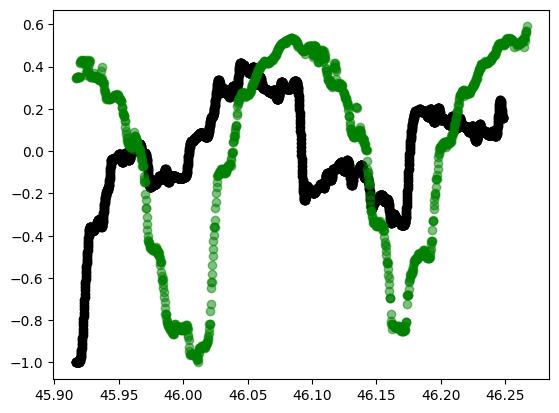

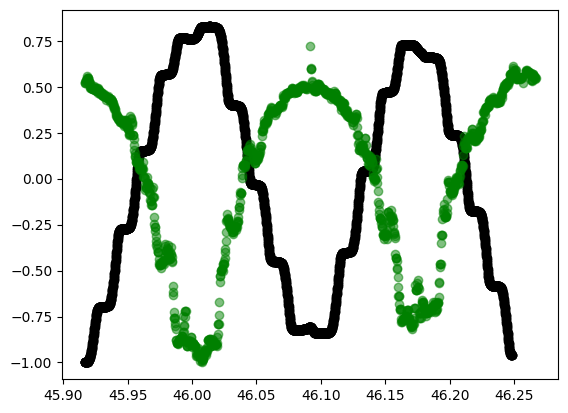

In [80]:
plot_var = 'LEFT_ANKLE'

df1 = test_mcl.copy()
df1 = add_xyz(df1)
df2 = thunder_df1.copy()
# df3 = lightning_df1.copy()

# time correction
time_int = [45 + (55.0/60), 46+(14.9/60)]
df1 = add_times(df1, time_int)

# manually remove the outliers
df2 = df2[df2['RIGHT_HIP_Y']>100]
# df3 = df3[df3['RIGHT_HIP_Y']>100]

df1 = normalize_df(df1, f'{plot_var}_X', f'{plot_var}_Y')
df2 = normalize_df(df2, f'{plot_var}_X', f'{plot_var}_Y')
# df3 = normalize_df(df3, f'{plot_var}_X', f'{plot_var}_Y')

plt.scatter(df1['time'], df1[f'{plot_var}_X'], color='black')
plt.scatter(df2['time'], -df2[f'{plot_var}_X'], color='green', alpha=.5)
# plt.scatter(df3['time'], df3[f'{plot_var}_X'], color='red', alpha=.5)
plt.show()

plt.scatter(df1['time'], df1[f'{plot_var}_Y'], color='black')
plt.scatter(df2['time'], -df2[f'{plot_var}_Y'], color='green', alpha=.5)
# plt.scatter(df3['time'], df3[f'{plot_var}_Y'], color='red', alpha=.5)
plt.show()

## Compare MCL with other things 

In [60]:
# def plot_angle_test(df, angle, coord):
#     P = world2cam(angle, coord)
#     for keypoint in mcl_keypoints:
#         df[keypoint] = df[keypoint].apply(lambda x: P@np.append(x,1))
    
#     df = add_xyz(df)

#     fig, ax = plt.subplots(1,2, figsize=(10,4))
    
#     ax[0].scatter(df['time'], df['LEFT_ANKLE_X'])
#     ax[0].set_title('Left Ankle X')
#     # plt.show()
#     ax[1].scatter(df['time'], df['LEFT_ANKLE_Y'])
#     ax[1].set_title('Left Ankle Y')
#     plt.show()

def make_angular_mcl(df, angle, coord):
    P = world2cam(angle, coord)
    for keypoint in mcl_keypoints:
        df[keypoint] = df[keypoint].apply(lambda x: -P@np.append(x,1))
    df = add_xyz(df)
    return df

mcl_1 = make_angular_mcl(og_mcl.copy(), a1, C1)
mcl_2 = make_angular_mcl(og_mcl.copy(), a2, C2)
mcl_4 = make_angular_mcl(og_mcl.copy(), a3, C3)
mcl_3 = make_angular_mcl(og_mcl.copy(), a4, C4)

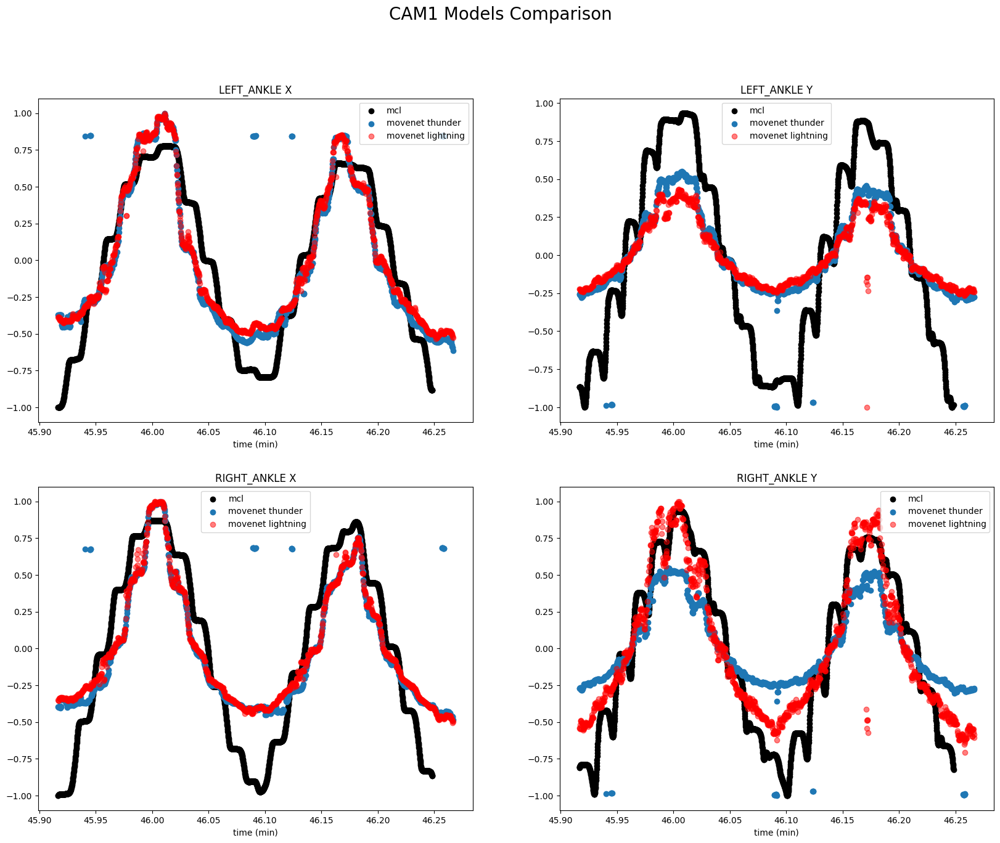

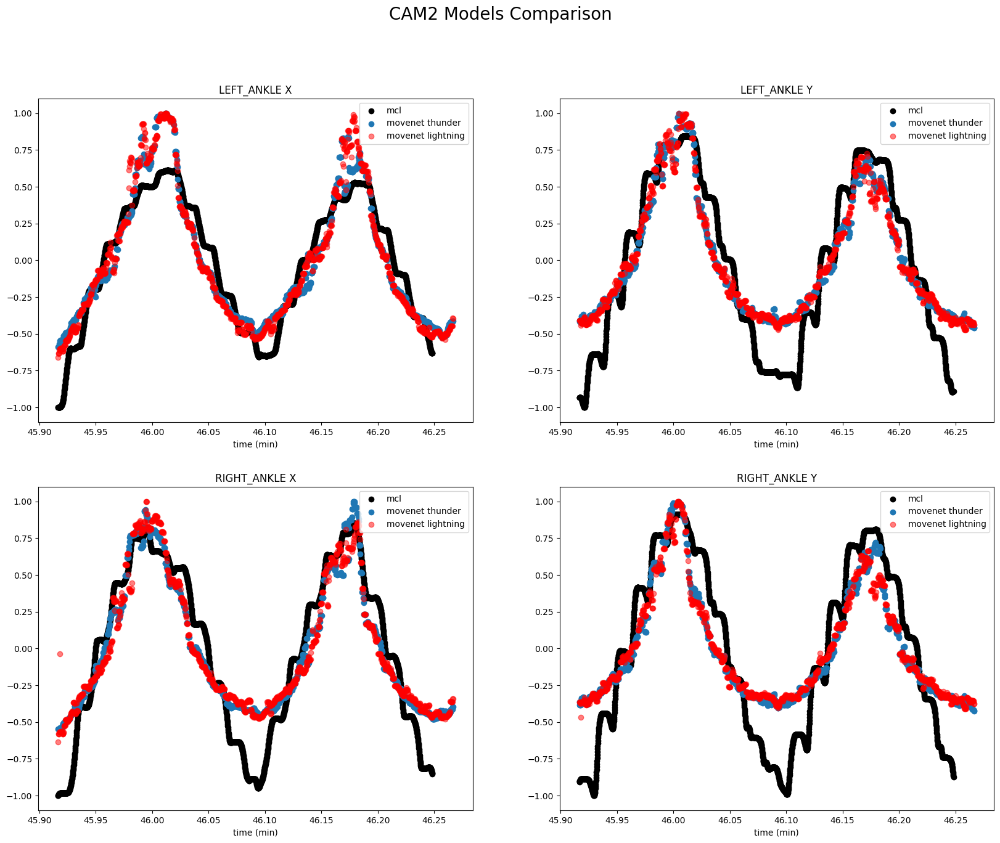

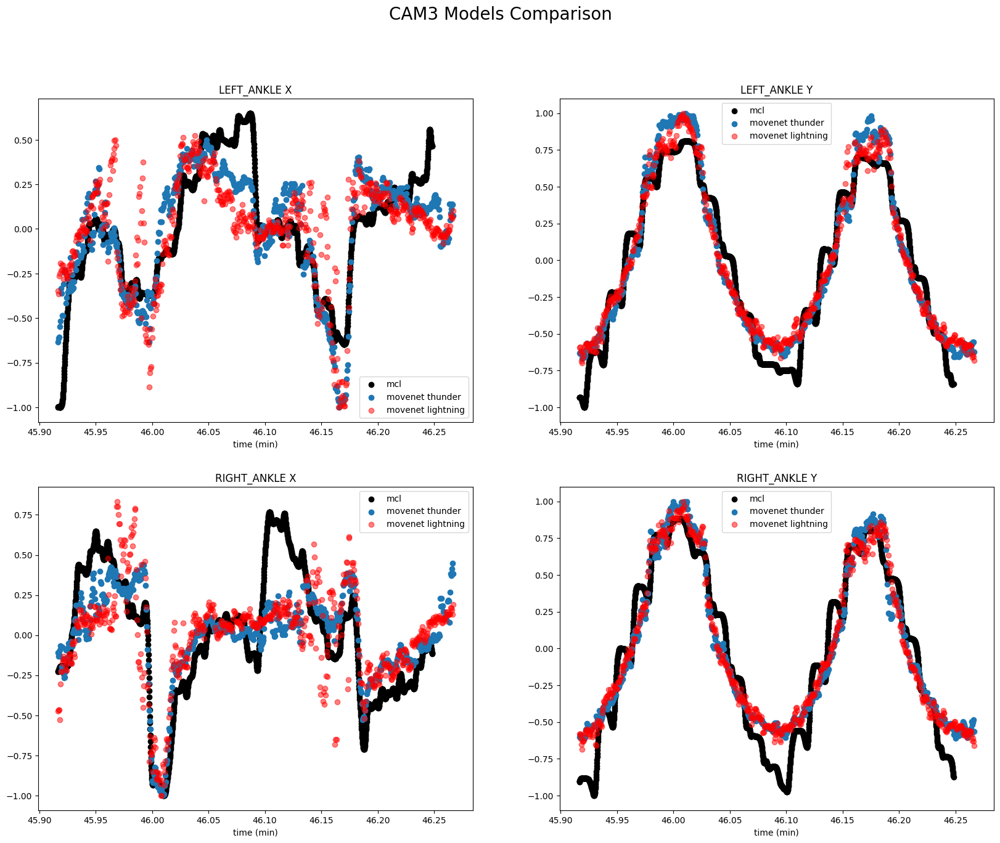

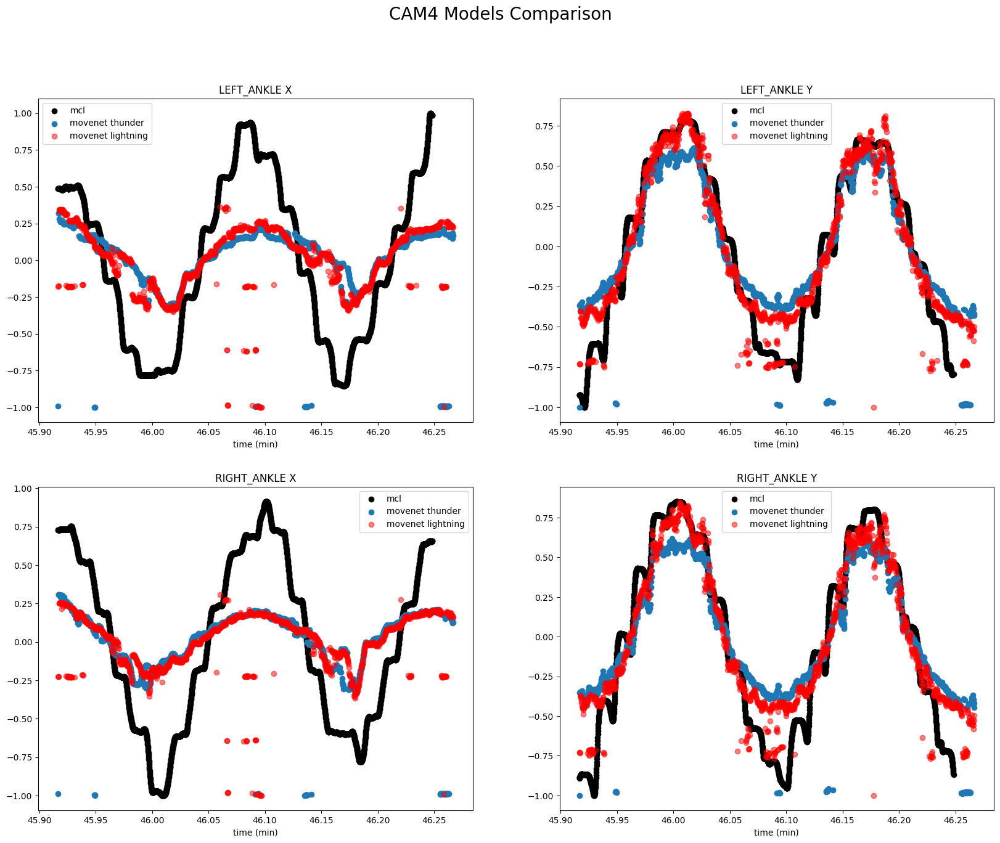

In [61]:
from utils import *

def scatter_compare(df1, df2, plot_vars, plot_title, df3=None, df4=None):
    fig, ax = plt.subplots(nrows=len(plot_vars), ncols=2, figsize=(20,15))
    fig.suptitle(plot_title, fontsize=20)

    for i in range(len(plot_vars)):
        ax[i,0].scatter(df1['time'], df1[plot_vars[i]+'_X'], label='mcl', color='black')
        ax[i,0].scatter(df2['time'], df2[plot_vars[i]+'_X'], label='movenet thunder', color='tab:blue')
        if df3 is not None:
            ax[i,0].scatter(df3['time'], df3[plot_vars[i]+'_X'], label='movenet lightning', color='red', alpha=.5)
        if df4 is not None:
            ax[i,0].scatter(df4['time'], df4[plot_vars[i]+'_X'], label='coral posenet', color='green')
        ax[i,0].set_title(f'{plot_vars[i]} X')
        ax[i,0].set_xlabel('time (min)')
        ax[i,0].legend()

        ax[i,1].scatter(df1['time'], df1[plot_vars[i]+'_Y'], label='mcl', color='black')
        ax[i,1].scatter(df2['time'], df2[plot_vars[i]+'_Y'], label='movenet thunder', color='tab:blue')
        if df3 is not None:
            ax[i,1].scatter(df3['time'], df3[plot_vars[i]+'_Y'], label='movenet lightning', color='red', alpha=.5)
        if df4 is not None:
            ax[i,1].scatter(df4['time'], df4[plot_vars[i]+'_Y'], label='coral posenet', color='green')
        ax[i,1].set_title(f'{plot_vars[i]} Y')
        ax[i,1].set_xlabel('time (min)')
        ax[i,1].legend()

    plt.show()

def prep_plot_dfs(df1, df2, df3, plot_vars):
    # time correction
    time_int = [45 + (55.0/60), 46+(14.9/60)]
    df1 = add_times(df1, time_int)

    for plot_var in plot_vars:
        df1 = normalize_df(df1, f'{plot_var}_X', f'{plot_var}_Y')
        df2 = normalize_df(df2, f'{plot_var}_X', f'{plot_var}_Y')
        df3 = normalize_df(df3, f'{plot_var}_X', f'{plot_var}_Y')

    return df1, df2, df3

plot_vars = ['LEFT_ANKLE', 'RIGHT_ANKLE']

df1, df2, df3 = mcl_1.copy(), thunder_df1.copy(), lightning_df1.copy()
df1, df2, df3 = prep_plot_dfs(df1, df2, df3, plot_vars)
# models_compare(df1, df2, df3, plot_vars, plot_title='CAM1 Models Comparison')
# scatter_compare(df1=df1, df2=df2, plot_vars=plot_vars, plot_title='CAM1 Models Comparison')
scatter_compare(df1=df1, df2=df2, df3=df3, plot_vars=plot_vars, plot_title='CAM1 Models Comparison')

df1, df2, df3 = mcl_2.copy(), thunder_df2.copy(), lightning_df2.copy()
for var in plot_vars:
    df2[f'{var}_X'] = -df2[f'{var}_X']
    df3[f'{var}_X'] = -df3[f'{var}_X']
df1, df2, df3 = prep_plot_dfs(df1, df2, df3, plot_vars)
# models_compare(df1, df2, df3, plot_vars, plot_title='CAM2 Models Comparison')
# scatter_compare(df1=df1, df2=df2, plot_vars=plot_vars, plot_title='CAM2 Models Comparison')
scatter_compare(df1=df1, df2=df2, df3=df3, plot_vars=plot_vars, plot_title='CAM2 Models Comparison')

df1, df2, df3 = mcl_3.copy(), thunder_df3.copy(), lightning_df3.copy()
for var in plot_vars:
    df2[f'{var}_X'] = -df2[f'{var}_X']
    df3[f'{var}_X'] = -df3[f'{var}_X']
df1, df2, df3 = prep_plot_dfs(df1, df2, df3, plot_vars)
# models_compare(df1, df2, df3, plot_vars, plot_title='CAM3 Models Comparison')
# scatter_compare(df1=df1, df2=df2, plot_vars=plot_vars, plot_title='CAM3 Models Comparison')
scatter_compare(df1=df1, df2=df2, df3=df3, plot_vars=plot_vars, plot_title='CAM3 Models Comparison')

df1, df2, df3 = mcl_4.copy(), thunder_df4.copy(), lightning_df4.copy()
df2 = df2[df2['RIGHT_HIP_Y']>100]
df1, df2, df3 = prep_plot_dfs(df1, df2, df3, plot_vars)
# models_compare(df1, df2, df3, plot_vars, plot_title='CAM4 Models Comparison')
# scatter_compare(df1=df1, df2=df2, plot_vars=plot_vars, plot_title='CAM4 Models Comparison')
scatter_compare(df1=df1, df2=df2, df3=df3, plot_vars=plot_vars, plot_title='CAM4 Models Comparison')

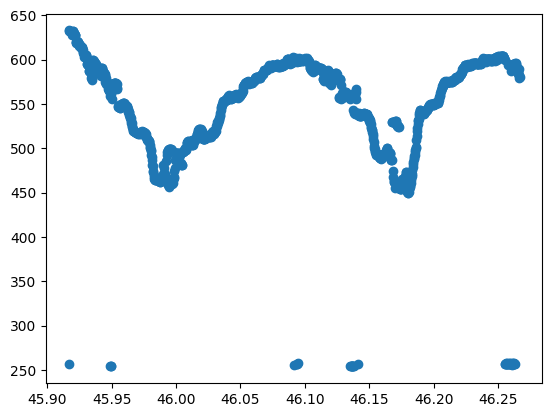

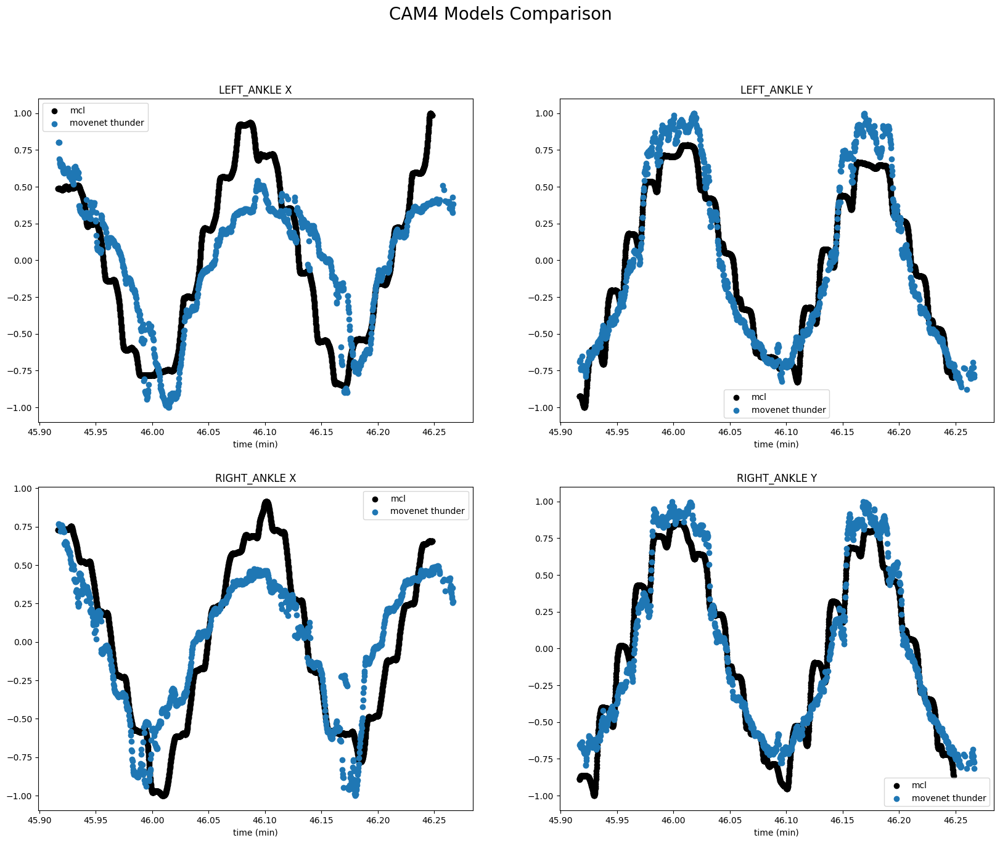

In [62]:
df1, df2, df3 = mcl_4.copy(), thunder_df4.copy(), lightning_df4.copy()
plt.scatter(df2['time'], df2['RIGHT_ANKLE_X'])
df2 = df2[df2['RIGHT_ANKLE_X']>300]
df1, df2, df3 = prep_plot_dfs(df1, df2, df3, plot_vars)
# models_compare(df1, df2, df3, plot_vars, plot_title='CAM4 Models Comparison')
scatter_compare(df1=df1, df2=df2, plot_vars=plot_vars, plot_title='CAM4 Models Comparison')

## Coral Outputs

In [78]:
l = [0, 1, 2, 3, 4]
print(map_integer_list(l,time_int[0], time_int[1]))

[45.925  46.0125 46.1    46.1875 46.275 ]
[45.925, 46.012499999999996, 46.099999999999994, 46.1875, 46.275]


In [110]:
def map_integer_list(list_of_integers, i, j):
  """
  Maps an integer list between 0 and n to be within a floating point range between i and j.

  Args:
    list_of_integers: The integer list to be mapped.
    i: The lower bound of the floating point range.
    j: The upper bound of the floating point range.

  Returns:
    The mapped integer list.
  """
  int_list = np.linspace(i, j, max(list_of_integers)+1)
  print(f"length of int list: {len(int_list)}")
  print(f"max index of list of integers: {max(list_of_integers)}\n")

  mapped_list = []
  for integer in list_of_integers:
    mapped_list.append(int_list[integer])

  print(f"max list of integers {max(list_of_integers)} min list of integers {min(list_of_integers)})")
  print(f"min linspace value: {min(int_list)} max linspace value: {max(int_list)}")
  print(f"int_list[max(list_of_integers)]: {int_list[max(list_of_integers)]} int_list[min(list_of_integers)]: {int_list[min(list_of_integers)]}]")
  print(f"min mapped value: {min(mapped_list)} max mapped value: {max(mapped_list)}")
  return mapped_list

def coral_time(df, time_int):
  """
  Maps the frame number to a time in seconds.

  Args:
    df: The dataframe containing the frame number.

  Returns:
    The dataframe with the frame number mapped to a time in seconds.
  """

  df['frame'] = df['NOSE'].apply(lambda row: int((row[-1].split('_')[1]).split(".")[0]))
  df['time'] = map_integer_list(df['frame'].tolist(), time_int[0], time_int[1])

  return df

In [111]:
coral_df1 = 'keypoint_files/coral_kps/rec1_crop'
coral_df2 = 'keypoint_files/coral_kps/rec2_crop'
coral_df3 = 'keypoint_files/coral_kps/rec3_crop'
coral_df4 = 'keypoint_files/coral_kps/rec4_crop'

coral_df1 = create_df_from_hour(coral_df1)
coral_df2 = create_df_from_hour(coral_df2)
coral_df3 = create_df_from_hour(coral_df3)
coral_df4 = create_df_from_hour(coral_df4)



DATA FILES ['keypoint_files/coral_kps/rec1_crop/images_09.csv', 'keypoint_files/coral_kps/rec1_crop/images_08.csv', 'keypoint_files/coral_kps/rec1_crop/images_00.csv', 'keypoint_files/coral_kps/rec1_crop/images_01.csv', 'keypoint_files/coral_kps/rec1_crop/images_03.csv', 'keypoint_files/coral_kps/rec1_crop/images_02.csv', 'keypoint_files/coral_kps/rec1_crop/images_06.csv', 'keypoint_files/coral_kps/rec1_crop/images_12.csv', 'keypoint_files/coral_kps/rec1_crop/images_13.csv', 'keypoint_files/coral_kps/rec1_crop/images_07.csv', 'keypoint_files/coral_kps/rec1_crop/images_11.csv', 'keypoint_files/coral_kps/rec1_crop/images_05.csv', 'keypoint_files/coral_kps/rec1_crop/images_04.csv', 'keypoint_files/coral_kps/rec1_crop/images_10.csv']
keypoint_files/coral_kps/rec1_crop/images_00.csv
keypoint_files/coral_kps/rec1_crop/images_01.csv
keypoint_files/coral_kps/rec1_crop/images_02.csv
keypoint_files/coral_kps/rec1_crop/images_03.csv
keypoint_files/coral_kps/rec1_crop/images_04.csv
keypoint_files/

In [112]:
coral_df1 = coral_time(coral_df1, time_int)
coral_df2 = coral_time(coral_df2, time_int)
coral_df3 = coral_time(coral_df3, time_int)
coral_df4 = coral_time(coral_df4, time_int)

length of int list: 1319
max index of list of integers: 1318

max list of integers 1318 min list of integers 0)
min linspace value: 45.925 max linspace value: 46.275
int_list[max(list_of_integers)]: 46.275 int_list[min(list_of_integers)]: 45.925]
min mapped value: 45.925 max mapped value: 46.275
length of int list: 1303
max index of list of integers: 1302

max list of integers 1302 min list of integers 0)
min linspace value: 45.925 max linspace value: 46.275
int_list[max(list_of_integers)]: 46.275 int_list[min(list_of_integers)]: 45.925]
min mapped value: 45.925 max mapped value: 46.275
length of int list: 660
max index of list of integers: 659

max list of integers 659 min list of integers 0)
min linspace value: 45.925 max linspace value: 46.275
int_list[max(list_of_integers)]: 46.275 int_list[min(list_of_integers)]: 45.925]
min mapped value: 45.925 max mapped value: 46.275
length of int list: 1330
max index of list of integers: 1329

max list of integers 1329 min list of integers 0)


In [113]:
print(time_int)

print(min(coral_df1['time'].tolist()), max(coral_df1['time'].tolist()))
print(min(coral_df2['time'].tolist()), max(coral_df2['time'].tolist()))
print(min(coral_df3['time'].tolist()), max(coral_df3['time'].tolist()))
print(min(coral_df4['time'].tolist()), max(coral_df4['time'].tolist()))

print(min(coral_df1['frame'].tolist()), max(coral_df1['frame'].tolist()))
print(min(coral_df2['frame'].tolist()), max(coral_df2['frame'].tolist()))
print(min(coral_df3['frame'].tolist()), max(coral_df3['frame'].tolist()))
print(min(coral_df4['frame'].tolist()), max(coral_df4['frame'].tolist()))

[45.925, 46.275]
45.925 46.275
45.925 46.275
45.925 46.275
45.925 46.275
0 1318
0 1302
0 659
0 1329


In [114]:
coral_df1 = clean_keypoints(coral_df1)
coral_df2 = clean_keypoints(coral_df2)
coral_df3 = clean_keypoints(coral_df3)
coral_df4 = clean_keypoints(coral_df4)

coral_df1 = split_x_y(coral_df1)
coral_df2 = split_x_y(coral_df2)
coral_df3 = split_x_y(coral_df3)
coral_df4 = split_x_y(coral_df4)

In [115]:
# df = coral_time(df, time_int)
# df = clean_keypoints(df)
# df = split_x_y(df)

# coral_df1 = create_pose_df_from_file_folder(coral_df1)
# coral_df2 = create_pose_df_from_file_folder(coral_df2)
# coral_df3 = create_pose_df_from_file_folder(coral_df3)
# coral_df4 = create_pose_df_from_file_folder(coral_df4)

# coral_df1 = add_times(coral_df1, time_int)
# coral_df2 = add_times(coral_df2, time_int)
# coral_df3 = add_times(coral_df3, time_int)
# coral_df4 = add_times(coral_df4, time_int)

coral_df1 = clean_keypoints(coral_df1)
coral_df2 = clean_keypoints(coral_df2)
coral_df3 = clean_keypoints(coral_df3)
coral_df4 = clean_keypoints(coral_df4)

In [116]:
# coral_df1 = split_x_y(coral_df1)
# coral_df2 = split_x_y(coral_df2)
# coral_df3 = split_x_y(coral_df3)
# coral_df4 = split_x_y(coral_df4)

coral_df3 = coral_df3[coral_df3['RIGHT_ANKLE_X']>150]
coral_df4 = coral_df4[coral_df4['RIGHT_ANKLE_X']<625]

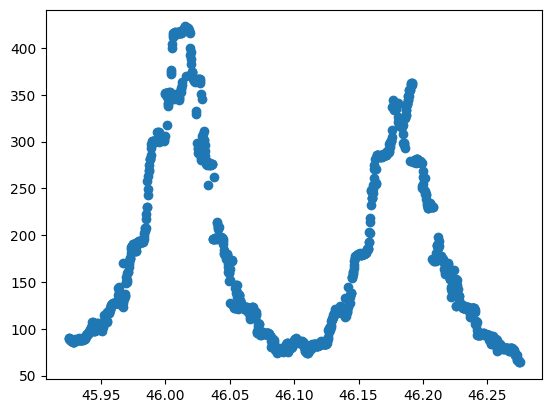

In [117]:
plt.scatter(coral_df1['time'], coral_df1['RIGHT_ANKLE_X'])

In [118]:
plot_vars

['LEFT_HIP', 'RIGHT_HIP']

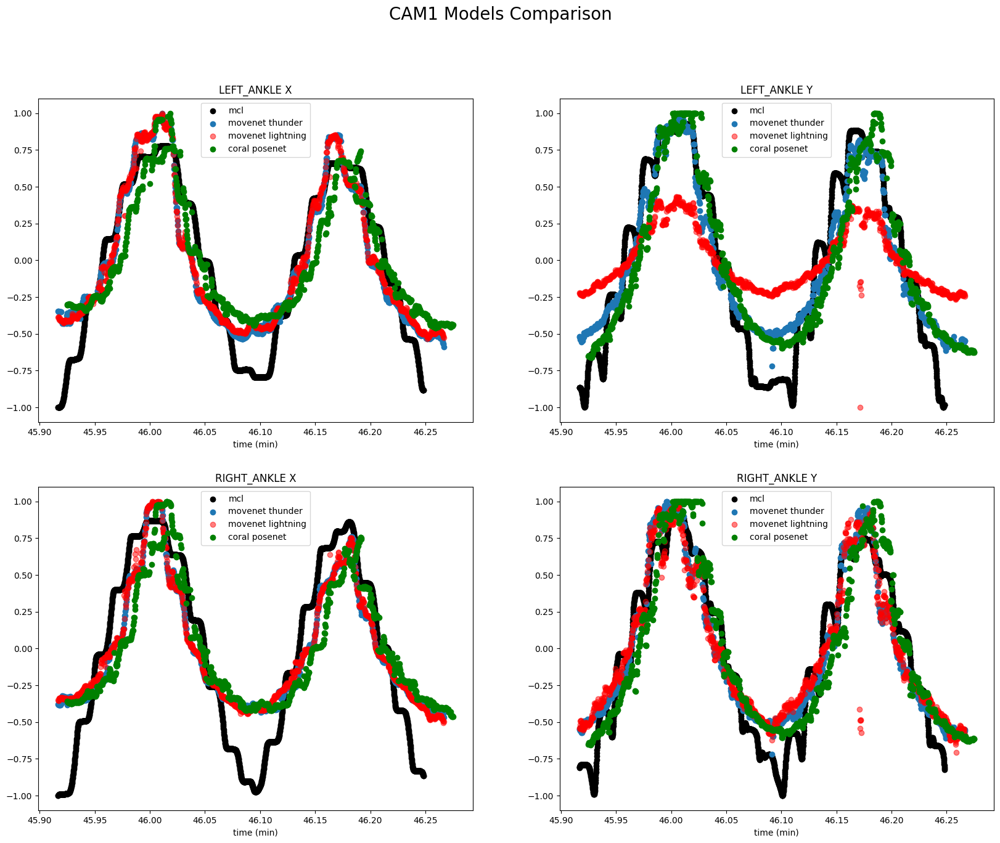

In [123]:
def prep_plot_dfs4(df1, df2, df3, df4, plot_vars):
    # time correction
    time_int = [45 + (55.0/60), 46+(14.9/60)]
    df1 = add_times(df1, time_int)

    # # manually remove the outliers
    # df2 = df2[df2['RIGHT_HIP_Y']>100]
    # df3 = df3[df3['RIGHT_HIP_Y']>100]

    for plot_var in plot_vars:
        df1 = normalize_df(df1, f'{plot_var}_X', f'{plot_var}_Y')
        df2 = normalize_df(df2, f'{plot_var}_X', f'{plot_var}_Y')
        df3 = normalize_df(df3, f'{plot_var}_X', f'{plot_var}_Y')
        df4 = normalize_df(df4, f'{plot_var}_X', f'{plot_var}_Y')
    
        # df4[f'{plot_var}_X'] = -df4[f'{plot_var}_X']

    return df1, df2, df3, df4

plot_vars = ['LEFT_ANKLE', 'RIGHT_ANKLE']

df1, df2, df3, df4 = mcl_1.copy(), thunder_df1.copy(), lightning_df1.copy(), coral_df1.copy()
df2 = df2[df2['RIGHT_HIP_Y']>100]
df1, df2, df3, df4 = prep_plot_dfs4(df1, df2, df3, df4, plot_vars)
# models_compare(df1, df2, df3, plot_vars, plot_title='CAM4 Models Comparison')
# scatter_compare(df1=df1, df2=df2, plot_vars=plot_vars, plot_title='CAM4 Models Comparison')
scatter_compare(df1=df1, df2=df2, df3=df3, df4=df4, plot_vars=plot_vars, plot_title='CAM1 Models Comparison')

df1, df2, df3, df4 = mcl_2.copy(), thunder_df2.copy(), lightning_df2.copy(), coral_df2.copy()
for var in plot_vars:
    df1[f'{var}_X'] = -df1[f'{var}_X']
df2 = df2[df2['RIGHT_HIP_Y']>100]
df1, df2, df3, df4 = prep_plot_dfs4(df1, df2, df3, df4, plot_vars)
# models_compare(df1, df2, df3, plot_vars, plot_title='CAM4 Models Comparison')
# scatter_compare(df1=df1, df2=df2, plot_vars=plot_vars, plot_title='CAM4 Models Comparison')
scatter_compare(df1=df1, df2=df2, df3=df3, df4=df4, plot_vars=plot_vars, plot_title='CAM2 Models Comparison')

df1, df2, df3, df4 = mcl_3.copy(), thunder_df3.copy(), lightning_df3.copy(), coral_df3.copy()
for var in plot_vars:
    df1[f'{var}_X'] = -df1[f'{var}_X']
df2 = df2[df2['RIGHT_HIP_Y']>100]
df1, df2, df3, df4 = prep_plot_dfs4(df1, df2, df3, df4, plot_vars)
# models_compare(df1, df2, df3, plot_vars, plot_title='CAM4 Models Comparison')
# scatter_compare(df1=df1, df2=df2, plot_vars=plot_vars, plot_title='CAM4 Models Comparison')
scatter_compare(df1=df1, df2=df2, df3=df3, df4=df4, plot_vars=plot_vars, plot_title='CAM3 Models Comparison')

df1, df2, df3, df4 = mcl_4.copy(), thunder_df4.copy(), lightning_df4.copy(), coral_df4.copy()
df2 = df2[df2['RIGHT_HIP_Y']>100]
df1, df2, df3, df4 = prep_plot_dfs4(df1, df2, df3, df4, plot_vars)
# models_compare(df1, df2, df3, plot_vars, plot_title='CAM4 Models Comparison')
# scatter_compare(df1=df1, df2=df2, plot_vars=plot_vars, plot_title='CAM4 Models Comparison')
scatter_compare(df1=df1, df2=df2, df3=df3, df4=df4, plot_vars=plot_vars, plot_title='CAM4 Models Comparison')

In [120]:
def add_com(clean_coral_df):
    
    # for kp in keypoints:
    #     clean_coral_df[f'{kp}_X'] = clean_coral_df.apply(lambda row: np.float(row[kp][0]), axis=1)
    #     clean_coral_df[f'{kp}_Y'] = clean_coral_df.apply(lambda row: np.float(row[kp][1]), axis=1)
    #     clean_coral_df[f'{kp}_PROB'] = clean_coral_df.apply(lambda row: np.float(row[kp][2]), axis=1)
    
    clean_coral_df['FOOT_X'] = clean_coral_df.apply(lambda row: 0.5*row.LEFT_ANKLE_X + 0.5*row.RIGHT_ANKLE_X, axis=1)
    clean_coral_df['FOOT_Y'] = clean_coral_df.apply(lambda row: 0.5*row.LEFT_ANKLE_X + 0.5*row.RIGHT_ANKLE_X, axis=1)

    clean_coral_df['LEFT_SHANK_X'] = clean_coral_df.apply(lambda row: 0.5*row.LEFT_KNEE_X + 0.5*row.LEFT_ANKLE_X, axis=1)
    clean_coral_df['LEFT_SHANK_Y'] = clean_coral_df.apply(lambda row: 0.5*row.LEFT_KNEE_Y + 0.5*row.LEFT_ANKLE_Y, axis=1)

    clean_coral_df['RIGHT_SHANK_X'] = clean_coral_df.apply(lambda row: 0.5*row.RIGHT_KNEE_X + 0.5*row.RIGHT_ANKLE_X, axis=1)
    clean_coral_df['RIGHT_SHANK_Y'] = clean_coral_df.apply(lambda row: 0.5*row.RIGHT_KNEE_Y + 0.5*row.RIGHT_ANKLE_Y, axis=1)

    clean_coral_df['SHANK_X'] = clean_coral_df.apply(lambda row: 0.5*row.LEFT_SHANK_X + 0.5*row.RIGHT_SHANK_X, axis=1)
    clean_coral_df['SHANK_Y'] = clean_coral_df.apply(lambda row: 0.5*row.LEFT_SHANK_Y + 0.5*row.RIGHT_SHANK_Y, axis=1)

    clean_coral_df['LEFT_THIGH_X'] = clean_coral_df.apply(lambda row: 0.5*row.LEFT_KNEE_X + 0.5*row.LEFT_HIP_X, axis=1)
    clean_coral_df['LEFT_THIGH_Y'] = clean_coral_df.apply(lambda row: 0.5*row.LEFT_KNEE_Y + 0.5*row.LEFT_HIP_Y, axis=1)
    clean_coral_df['RIGHT_THIGH_X'] = clean_coral_df.apply(lambda row: 0.5*row.RIGHT_KNEE_X + 0.5*row.RIGHT_HIP_X, axis=1)
    clean_coral_df['RIGHT_THIGH_Y'] = clean_coral_df.apply(lambda row: 0.5*row.RIGHT_KNEE_Y + 0.5*row.RIGHT_HIP_Y, axis=1)

    clean_coral_df['THIGH_X'] = clean_coral_df.apply(lambda row: 0.5*row.LEFT_THIGH_X + 0.5*row.RIGHT_THIGH_X, axis=1)
    clean_coral_df['THIGH_Y'] = clean_coral_df.apply(lambda row: 0.5*row.LEFT_THIGH_Y + 0.5*row.RIGHT_THIGH_Y, axis=1)

    clean_coral_df['HAND_X'] = clean_coral_df.apply(lambda row: 0.5*row.LEFT_WRIST_X + 0.5*row.RIGHT_WRIST_X, axis=1)
    clean_coral_df['HAND_Y'] = clean_coral_df.apply(lambda row: 0.5*row.LEFT_WRIST_Y + 0.5*row.RIGHT_WRIST_Y, axis=1)

    clean_coral_df['LEFT_FOREARM_X'] = clean_coral_df.apply(lambda row: 0.5*row.LEFT_WRIST_X + 0.5*row.LEFT_ELBOW_X, axis=1)
    clean_coral_df['LEFT_FOREARM_Y'] = clean_coral_df.apply(lambda row: 0.5*row.LEFT_WRIST_Y + 0.5*row.LEFT_ELBOW_Y, axis=1)
    clean_coral_df['RIGHT_FOREARM_X'] = clean_coral_df.apply(lambda row: 0.5*row.RIGHT_WRIST_X + 0.5*row.RIGHT_ELBOW_X, axis=1)
    clean_coral_df['RIGHT_FOREARM_Y'] = clean_coral_df.apply(lambda row: 0.5*row.RIGHT_WRIST_Y + 0.5*row.RIGHT_ELBOW_Y, axis=1)

    clean_coral_df['FOREARM_X'] = clean_coral_df.apply(lambda row: 0.5*row.LEFT_WRIST_X + 0.5*row.RIGHT_WRIST_X, axis=1)
    clean_coral_df['FOREARM_Y'] = clean_coral_df.apply(lambda row: 0.5*row.LEFT_WRIST_Y + 0.5*row.RIGHT_WRIST_Y, axis=1)

    clean_coral_df['LEFT_UPARM_X'] = clean_coral_df.apply(lambda row: 0.5*row.LEFT_SHOULDER_X + 0.5*row.LEFT_ELBOW_X, axis=1)
    clean_coral_df['LEFT_UPARM_Y'] = clean_coral_df.apply(lambda row: 0.5*row.LEFT_SHOULDER_Y + 0.5*row.LEFT_ELBOW_Y, axis=1)
    clean_coral_df['RIGHT_UPARM_X'] = clean_coral_df.apply(lambda row: 0.5*row.RIGHT_SHOULDER_X + 0.5*row.RIGHT_ELBOW_X, axis=1)
    clean_coral_df['RIGHT_UPARM_Y'] = clean_coral_df.apply(lambda row: 0.5*row.RIGHT_SHOULDER_Y + 0.5*row.RIGHT_ELBOW_Y, axis=1)

    clean_coral_df['UPARM_X'] = clean_coral_df.apply(lambda row: 0.5*row.LEFT_UPARM_X + 0.5*row.RIGHT_UPARM_X, axis=1)
    clean_coral_df['UPARM_Y'] = clean_coral_df.apply(lambda row: 0.5*row.LEFT_UPARM_Y + 0.5*row.RIGHT_UPARM_Y, axis=1)

    clean_coral_df['PELVIS_X'] = clean_coral_df.apply(lambda row: 0.5*row.LEFT_HIP_X + 0.5*row.RIGHT_HIP_X, axis=1)
    clean_coral_df['PELVIS_Y'] = clean_coral_df.apply(lambda row: 0.5*row.LEFT_HIP_Y + 0.5*row.RIGHT_HIP_Y, axis=1)

    clean_coral_df['LEFT_THORAX_X'] = clean_coral_df.apply(lambda row: 0.5*row.LEFT_SHOULDER_X + 0.5*row.LEFT_HIP_X, axis=1)
    clean_coral_df['LEFT_THORAX_Y'] = clean_coral_df.apply(lambda row: 0.5*row.LEFT_SHOULDER_Y + 0.5*row.LEFT_HIP_Y, axis=1)
    clean_coral_df['RIGHT_THORAX_X'] = clean_coral_df.apply(lambda row: 0.5*row.RIGHT_SHOULDER_X + 0.5*row.RIGHT_HIP_X, axis=1)
    clean_coral_df['RIGHT_THORAX_Y'] = clean_coral_df.apply(lambda row: 0.5*row.RIGHT_SHOULDER_Y + 0.5*row.RIGHT_HIP_Y, axis=1)

    clean_coral_df['THORAX_X'] = clean_coral_df.apply(lambda row: 0.5*row.LEFT_THORAX_X + 0.5*row.RIGHT_THORAX_X, axis=1)
    clean_coral_df['THORAX_Y'] = clean_coral_df.apply(lambda row: 0.5*row.LEFT_THORAX_Y + 0.5*row.RIGHT_THORAX_Y, axis=1)

    clean_coral_df['HEAD_X'] = clean_coral_df['NOSE_X']
    clean_coral_df['HEAD_Y'] = clean_coral_df['NOSE_Y']

    clean_coral_df['TRUNK_X'] = clean_coral_df['THORAX_X']
    clean_coral_df['TRUNK_Y'] = clean_coral_df['THORAX_Y']

    clean_coral_df['COM_X'] = clean_coral_df.apply(lambda row: (1/1.286)*(0.0145*row.FOOT_X + 
                                                                          0.0465*row.SHANK_X + 
                                                                          0.10*row.THIGH_X + 
                                                                          0.006*row.HAND_X + 
                                                                          0.016*row.FOREARM_X + 
                                                                          0.028*row.UPARM_X + 
                                                                          0.142*row.PELVIS_X + 
                                                                          0.355*row.THORAX_X + 
                                                                          0.081*row.HEAD_X + 
                                                                          0.497*row.TRUNK_X) , axis=1)

    clean_coral_df['COM_Y'] = clean_coral_df.apply(lambda row: (1/1.286)*(0.0145*row.FOOT_Y + 
                                                                          0.0465*row.SHANK_Y + 
                                                                          0.10*row.THIGH_Y + 
                                                                          0.006*row.HAND_Y + 
                                                                          0.016*row.FOREARM_Y + 
                                                                          0.028*row.UPARM_Y + 
                                                                          0.142*row.PELVIS_Y + 
                                                                          0.355*row.THORAX_Y + 
                                                                          0.081*row.HEAD_Y + 
                                                                          0.497*row.TRUNK_Y) , axis=1)
    
    return clean_coral_df

In [121]:
df2 = thunder_df1.copy()
df2 = add_com(df2)
df2.head()

,time,time_int,NOSE_X,NOSE_Y,LEFT_EYE_X,LEFT_EYE_Y,RIGHT_EYE_X,RIGHT_EYE_Y,LEFT_EAR_X,LEFT_EAR_Y,...,RIGHT_THORAX_X,RIGHT_THORAX_Y,THORAX_X,THORAX_Y,HEAD_X,HEAD_Y,TRUNK_X,TRUNK_Y,COM_X,COM_Y
0,45.916667,45.916667,103.341179,129.497051,106.051540,125.780110,100.020561,124.900460,109.394493,128.860302,...,90.004091,172.537308,100.448470,171.877263,103.341179,129.497051,100.448470,171.877263,100.730838,177.268261
1,45.916932,45.916932,102.240419,127.856083,104.911718,124.717941,99.039955,123.795676,108.674908,128.411150,...,89.515853,172.862685,99.688277,172.424659,102.240419,127.856083,99.688277,172.424659,99.947270,177.747149
2,45.917198,45.917198,101.519346,128.401637,104.231310,125.679774,98.986034,125.579753,108.271847,128.890529,...,89.159813,172.979507,99.093187,172.587247,101.519346,128.401637,99.093187,172.587247,99.393869,177.759181
3,45.917463,45.917463,100.421762,127.681146,103.117399,125.031996,97.996836,125.291691,107.158985,128.535948,...,89.021306,172.568171,98.753283,172.070031,100.421762,127.681146,98.753283,172.070031,99.102322,177.270706
4,45.917729,45.917729,100.674992,127.103348,103.275452,124.118700,98.033581,123.663182,107.007074,127.806115,...,88.854342,171.400516,98.679419,170.682814,100.674992,127.103348,98.679419,170.682814,99.046921,175.971391


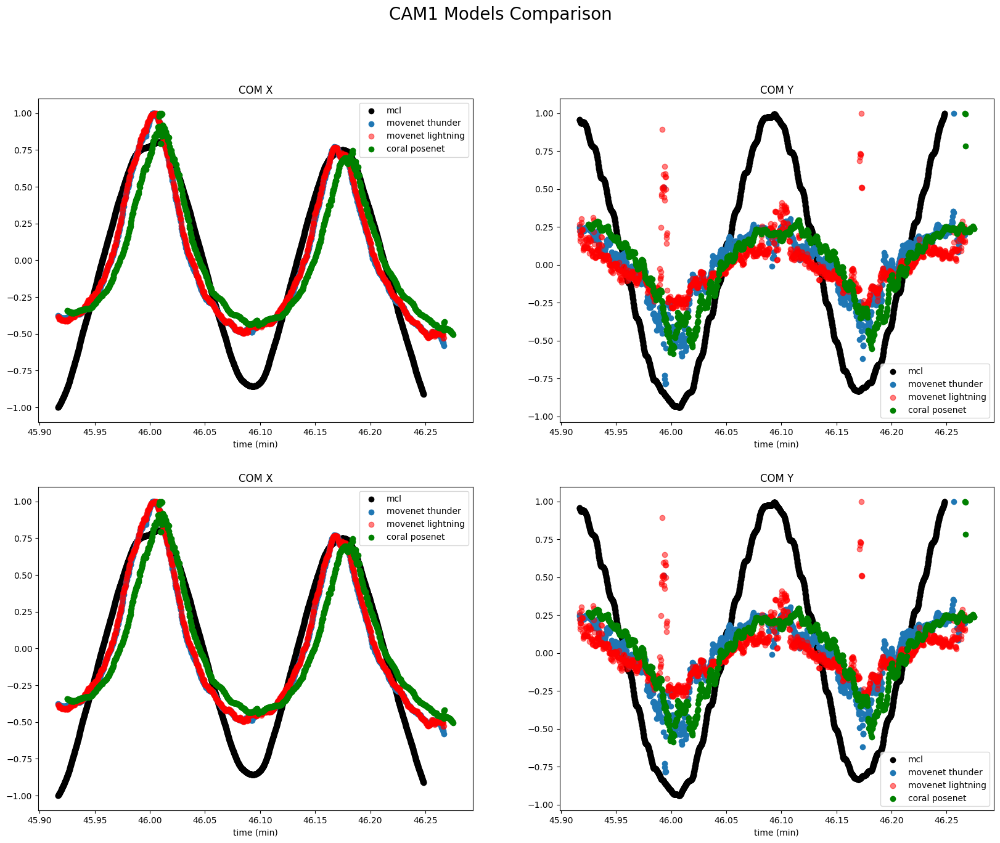

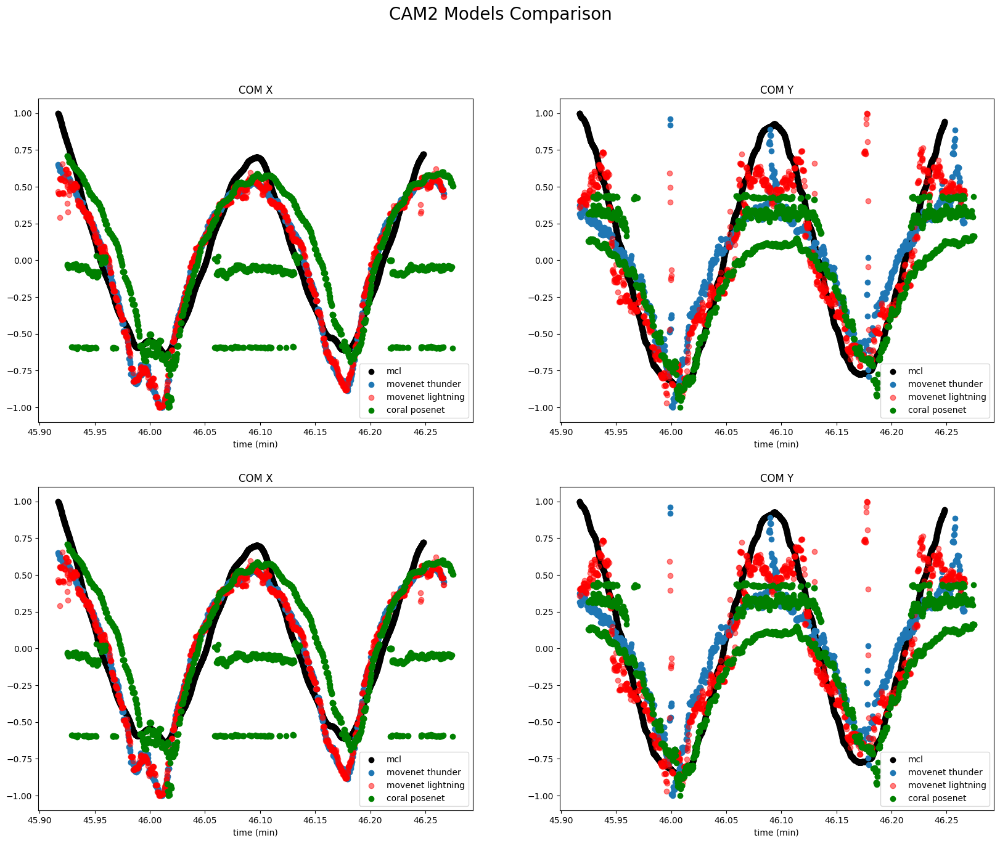

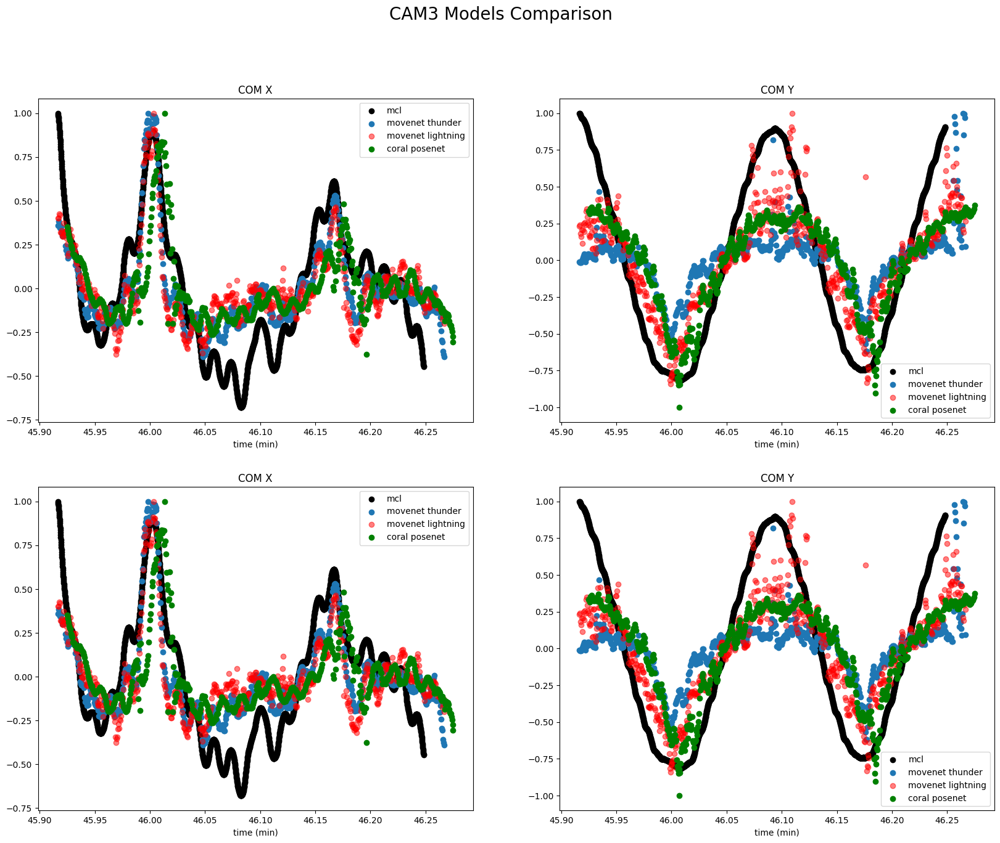

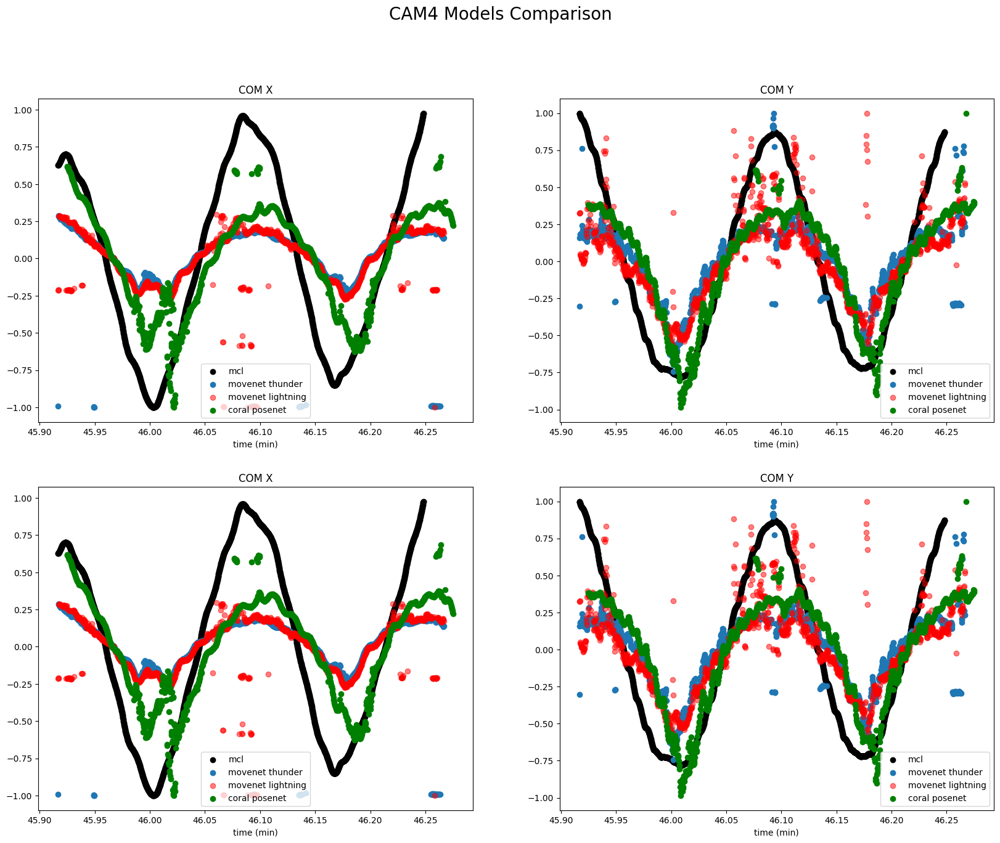

In [122]:
plot_vars = ['COM', 'COM']

df1, df2, df3, df4 = mcl_1.copy(), thunder_df1.copy(), lightning_df1.copy(), coral_df1.copy()
df2 = add_com(df2)
df3 = add_com(df3)
df4 = add_com(df4)
df1[f'COM_Y'] = -df1[f'COM_Y']
df2 = df2[df2['RIGHT_HIP_Y']>100]
df1, df2, df3, df4 = prep_plot_dfs4(df1, df2, df3, df4, plot_vars)
# models_compare(df1, df2, df3, plot_vars, plot_title='CAM4 Models Comparison')
# scatter_compare(df1=df1, df2=df2, plot_vars=plot_vars, plot_title='CAM4 Models Comparison')
scatter_compare(df1=df1, df2=df2, df3=df3, df4=df4, plot_vars=plot_vars, plot_title='CAM1 Models Comparison')

df1, df2, df3, df4 = mcl_2.copy(), thunder_df2.copy(), lightning_df2.copy(), coral_df2.copy()
df2 = add_com(df2)
df3 = add_com(df3)
df4 = add_com(df4)
df1[f'COM_X'] = -df1[f'COM_X']
df1[f'COM_Y'] = -df1[f'COM_Y']
df2 = df2[df2['RIGHT_HIP_Y']>100]
df1, df2, df3, df4 = prep_plot_dfs4(df1, df2, df3, df4, plot_vars)
# models_compare(df1, df2, df3, plot_vars, plot_title='CAM4 Models Comparison')
# scatter_compare(df1=df1, df2=df2, plot_vars=plot_vars, plot_title='CAM4 Models Comparison')
scatter_compare(df1=df1, df2=df2, df3=df3, df4=df4, plot_vars=plot_vars, plot_title='CAM2 Models Comparison')

df1, df2, df3, df4 = mcl_3.copy(), thunder_df3.copy(), lightning_df3.copy(), coral_df3.copy()
df2 = add_com(df2)
df3 = add_com(df3)
df4 = add_com(df4)
df1[f'COM_Y'] = -df1[f'COM_Y']
df1['COM_X'] = -df1['COM_X']
# for var in plot_vars:
#     df1[f'{var}_X'] = -df1[f'{var}_X']
df2 = df2[df2['RIGHT_HIP_Y']>100]
df1, df2, df3, df4 = prep_plot_dfs4(df1, df2, df3, df4, plot_vars)
# models_compare(df1, df2, df3, plot_vars, plot_title='CAM4 Models Comparison')
# scatter_compare(df1=df1, df2=df2, plot_vars=plot_vars, plot_title='CAM4 Models Comparison')
scatter_compare(df1=df1, df2=df2, df3=df3, df4=df4, plot_vars=plot_vars, plot_title='CAM3 Models Comparison')

df1, df2, df3, df4 = mcl_4.copy(), thunder_df4.copy(), lightning_df4.copy(), coral_df4.copy()
df2 = df2[df2['RIGHT_HIP_Y']>100]
df2 = add_com(df2)
df3 = add_com(df3)
df4 = add_com(df4)
df1[f'COM_Y'] = -df1[f'COM_Y']
df1, df2, df3, df4 = prep_plot_dfs4(df1, df2, df3, df4, plot_vars)
# models_compare(df1, df2, df3, plot_vars, plot_title='CAM4 Models Comparison')
# scatter_compare(df1=df1, df2=df2, plot_vars=plot_vars, plot_title='CAM4 Models Comparison')
scatter_compare(df1=df1, df2=df2, df3=df3, df4=df4, plot_vars=plot_vars, plot_title='CAM4 Models Comparison')



<class 'pandas.core.series.Series'>
<class 'pandas.core.series.Series'>


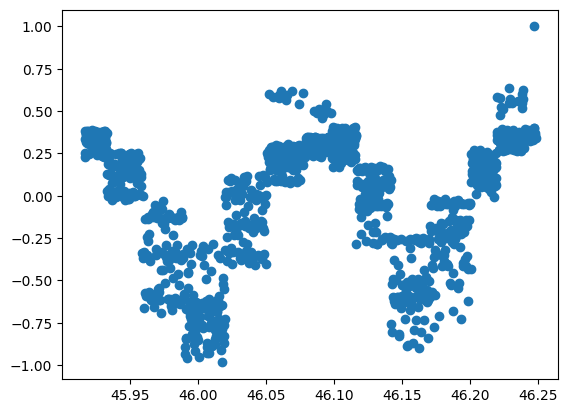

In [93]:
print(type(df2['COM_X']))
print(type(df2['NOSE_X']))

plt.scatter(df4['time'], df4['COM_Y'])

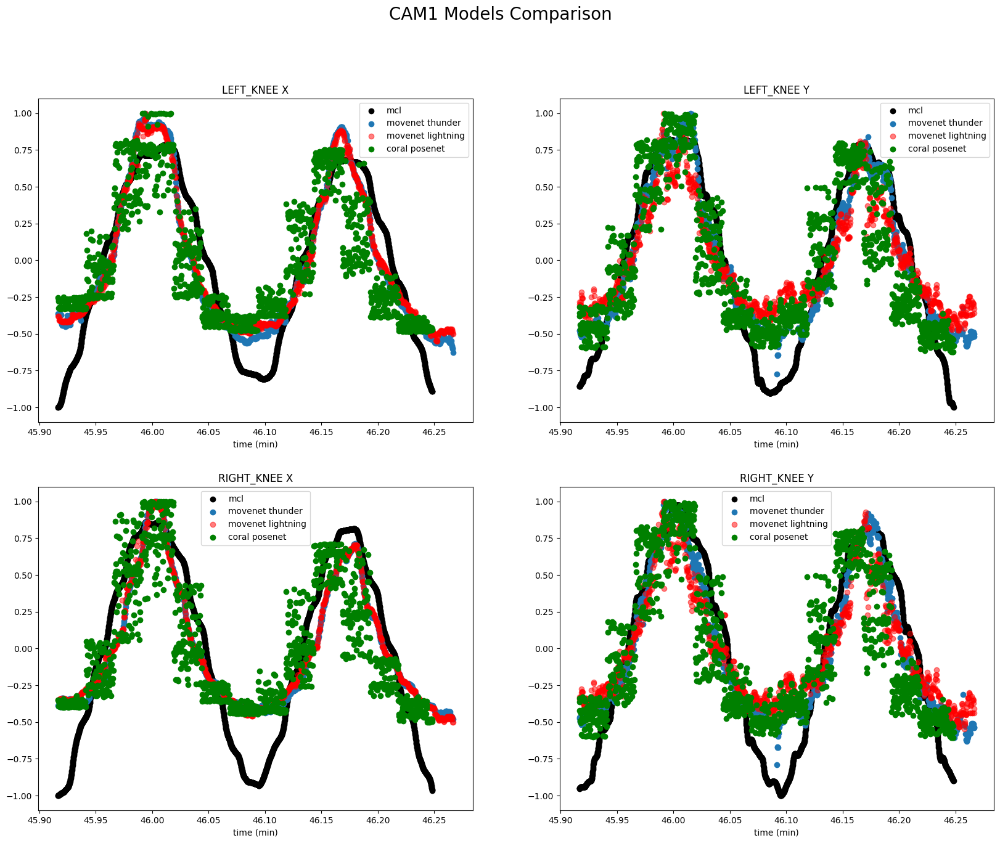

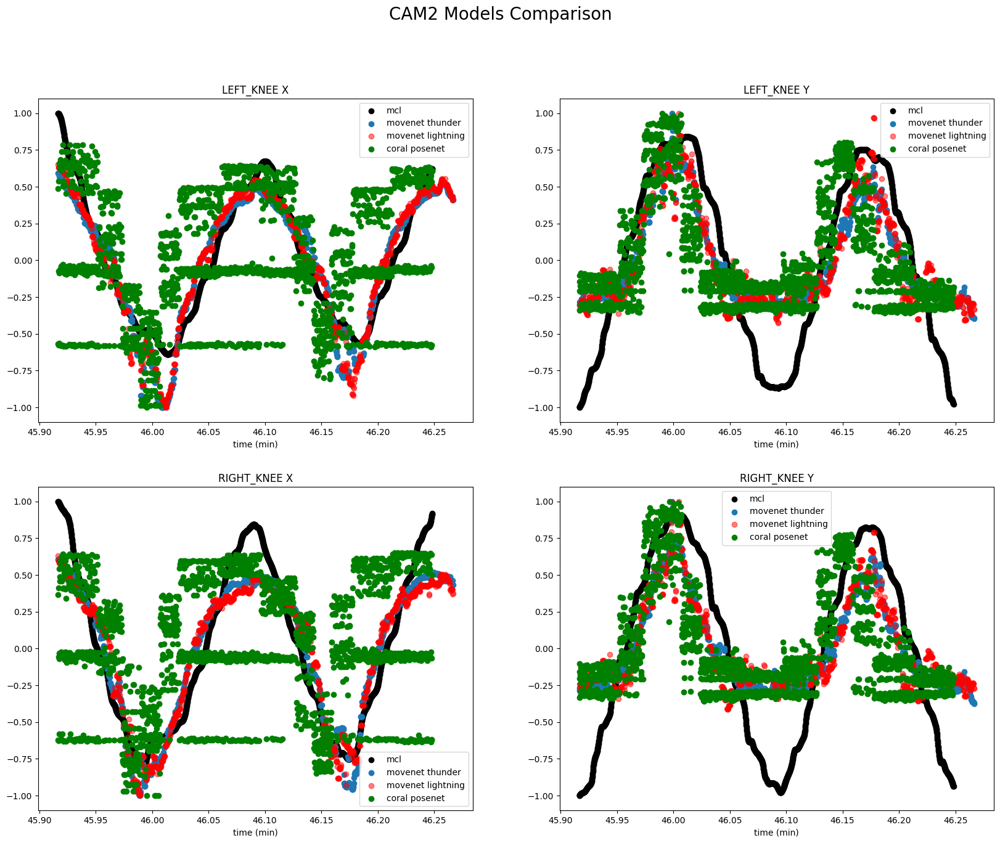

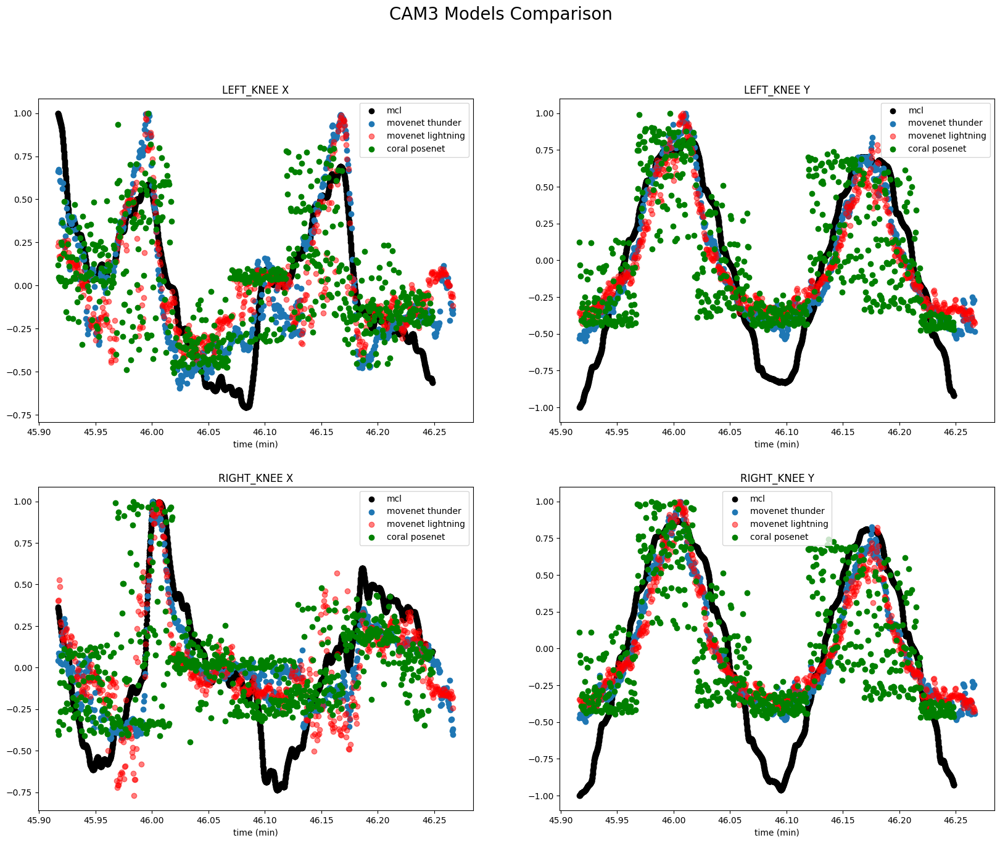

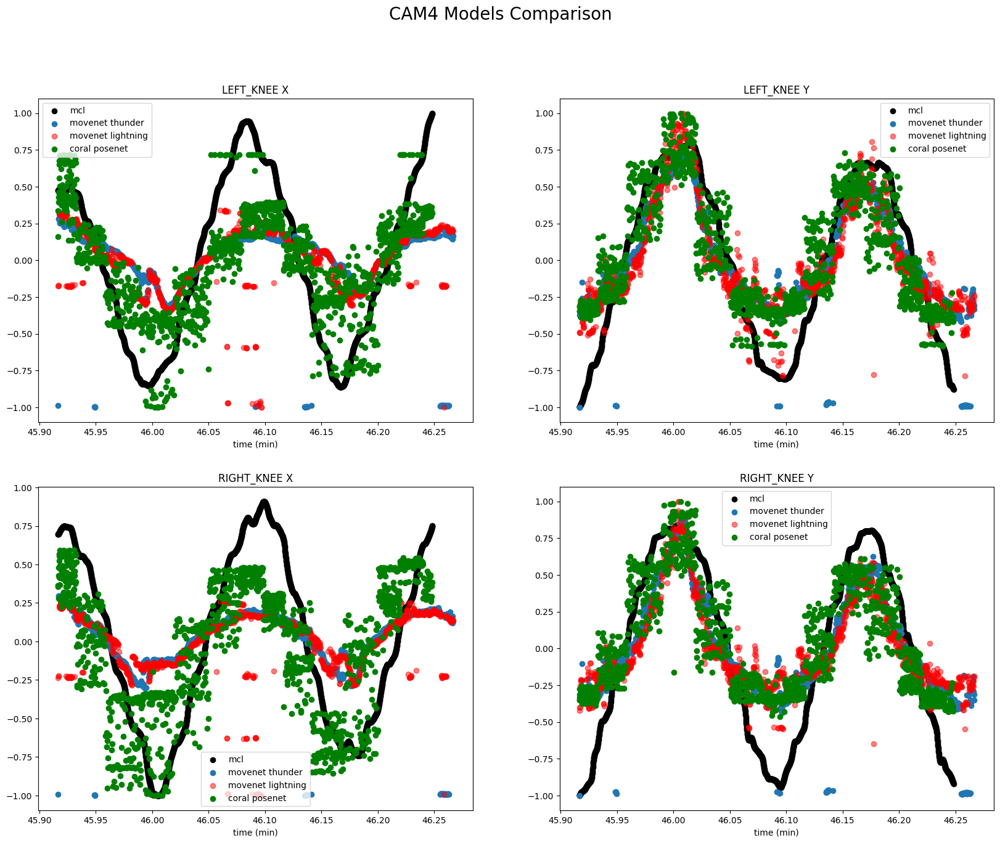

In [94]:
plot_vars = ['LEFT_KNEE', 'RIGHT_KNEE']

df1, df2, df3, df4 = mcl_1.copy(), thunder_df1.copy(), lightning_df1.copy(), coral_df1.copy()
df2 = df2[df2['RIGHT_HIP_Y']>100]
df1, df2, df3, df4 = prep_plot_dfs4(df1, df2, df3, df4, plot_vars)
# models_compare(df1, df2, df3, plot_vars, plot_title='CAM4 Models Comparison')
# scatter_compare(df1=df1, df2=df2, plot_vars=plot_vars, plot_title='CAM4 Models Comparison')
scatter_compare(df1=df1, df2=df2, df3=df3, df4=df4, plot_vars=plot_vars, plot_title='CAM1 Models Comparison')

df1, df2, df3, df4 = mcl_2.copy(), thunder_df2.copy(), lightning_df2.copy(), coral_df2.copy()
df2 = df2[df2['RIGHT_HIP_Y']>100]
for var in plot_vars:
    df1[f'{var}_X'] = -df1[f'{var}_X']
df1, df2, df3, df4 = prep_plot_dfs4(df1, df2, df3, df4, plot_vars)
# models_compare(df1, df2, df3, plot_vars, plot_title='CAM4 Models Comparison')
# scatter_compare(df1=df1, df2=df2, plot_vars=plot_vars, plot_title='CAM4 Models Comparison')
scatter_compare(df1=df1, df2=df2, df3=df3, df4=df4, plot_vars=plot_vars, plot_title='CAM2 Models Comparison')

df1, df2, df3, df4 = mcl_3.copy(), thunder_df3.copy(), lightning_df3.copy(), coral_df3.copy()
df2 = df2[df2['RIGHT_HIP_Y']>100]
for var in plot_vars:
    df1[f'{var}_X'] = -df1[f'{var}_X']
df1, df2, df3, df4 = prep_plot_dfs4(df1, df2, df3, df4, plot_vars)
# models_compare(df1, df2, df3, plot_vars, plot_title='CAM4 Models Comparison')
# scatter_compare(df1=df1, df2=df2, plot_vars=plot_vars, plot_title='CAM4 Models Comparison')
scatter_compare(df1=df1, df2=df2, df3=df3, df4=df4, plot_vars=plot_vars, plot_title='CAM3 Models Comparison')

df1, df2, df3, df4 = mcl_4.copy(), thunder_df4.copy(), lightning_df4.copy(), coral_df4.copy()
df2 = df2[df2['RIGHT_HIP_Y']>100]
df1, df2, df3, df4 = prep_plot_dfs4(df1, df2, df3, df4, plot_vars)
# models_compare(df1, df2, df3, plot_vars, plot_title='CAM4 Models Comparison')
# scatter_compare(df1=df1, df2=df2, plot_vars=plot_vars, plot_title='CAM4 Models Comparison')
scatter_compare(df1=df1, df2=df2, df3=df3, df4=df4, plot_vars=plot_vars, plot_title='CAM4 Models Comparison')

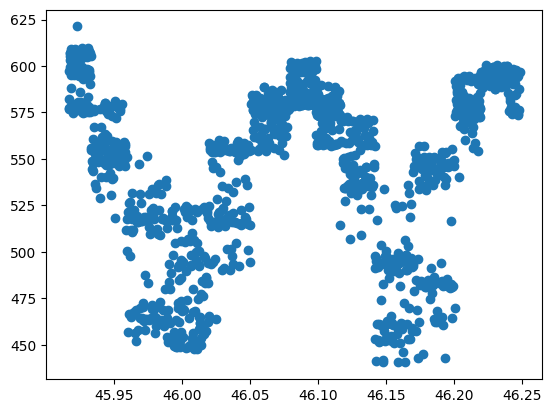

In [95]:

plt.scatter(coral_df4['time'], coral_df4['RIGHT_ANKLE_X'])

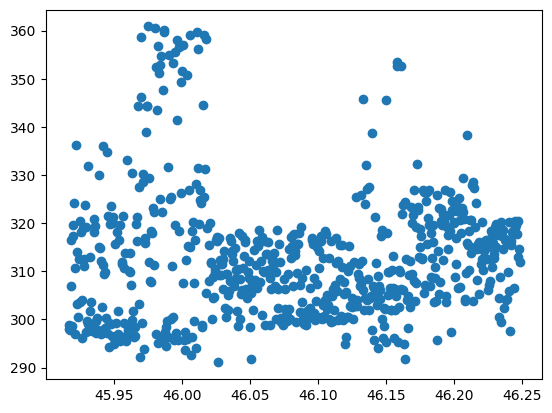

In [96]:

plt.scatter(coral_df3['time'], coral_df3['RIGHT_ANKLE_X'])

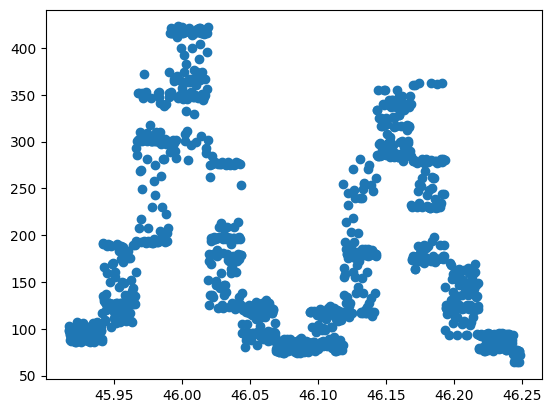

In [97]:
# coral_df4 = coral_df4[coral_df4['RIGHT_ANKLE_X']<625]
plt.scatter(coral_df1['time'], coral_df1['RIGHT_ANKLE_X'])

In [98]:
print(len(coral_df1))
print(coral_df1['time'].max() - coral_df1['time'].min())

1340
0.33166666666667055


In [ ]:
coral_df1.head()

## Figuring out stride times

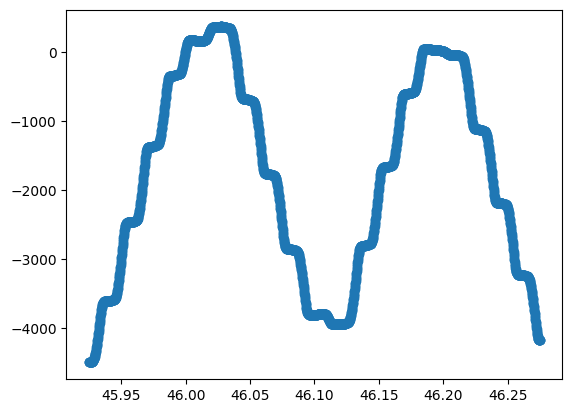

In [99]:
from scipy.signal import argrelextrema

var = 'LEFT_ANKLE_X'
timeseries_df = mcl_1.copy()
# df1, df2, df3, df4 = mcl_1.copy(), thunder_df1.copy(), lightning_df1.copy(), coral_df1.copy()
# timeseries_df = timeseries_df[timeseries_df['time'] > 11.16]
# timeseries_df = timeseries_df[timeseries_df['time'] < 11.36]

# timeseries_df['time'] = np.linspace(0,13, len(timeseries_df))

# var = 'Right Ankle Vertical'


x = timeseries_df[var].to_numpy()

plt.scatter(timeseries_df['time'], timeseries_df[var])

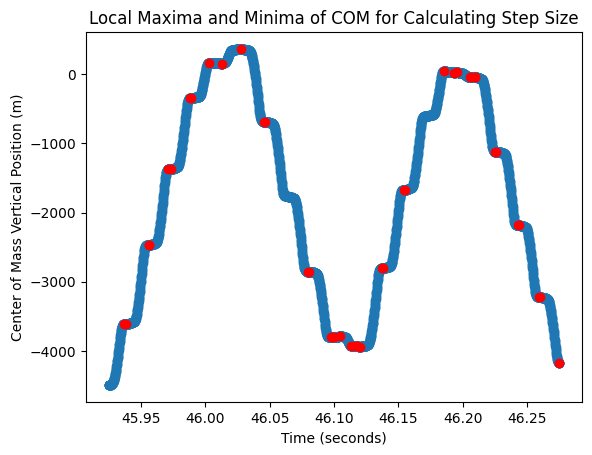

In [100]:
# for local maxima
maxima = argrelextrema(x, np.greater)
# for local minima
minima = argrelextrema(x, np.less)

plt.scatter(timeseries_df['time'], timeseries_df[var])
for m in maxima:
    plt.scatter(timeseries_df['time'][m], timeseries_df[var][m], color='red')
    
for m in minima:
    plt.scatter(timeseries_df['time'][m], timeseries_df[var][m], color='red')
    
    
maxima_times = timeseries_df.iloc[maxima]['time'].to_numpy()
minima_times = timeseries_df.iloc[minima]['time'].to_numpy()

maxima_diffs = np.diff(maxima_times)
minima_diffs = np.diff(minima_times)

plt.title('Local Maxima and Minima of COM for Calculating Step Size')
plt.xlabel('Time (seconds)')
plt.ylabel('Center of Mass Vertical Position (m)')
# plt.text(11.12, 0.276, f"Average maxima distance: {maxima_diffs.mean():.2f} seconds\nAverage minima distance: {minima_diffs.mean():.2f} seconds", fontsize=12)
# plt.text(11.12, 0.270, f"True step size: 0.506 seconds", fontsize=12)

# print(maxima_diffs.mean()*60, ' seconds')
# print(minima_diffs.mean()*60, ' seconds')

plt.show()

In [101]:
print(maxima_diffs)

plt.

SyntaxError: invalid syntax (1891167970.py, line 3)

## Animation Test

In [27]:
# import sys
# # !conda install --yes --prefix {sys.prefix} ipympl
# !{sys.executable} -m pip install ipympl

  Using cached ipympl-0.9.3-py2.py3-none-any.whl (511 kB)
  Using cached ipywidgets-8.0.6-py3-none-any.whl (138 kB)
  Using cached ipython_genutils-0.2.0-py2.py3-none-any.whl (26 kB)
  Using cached jupyterlab_widgets-3.0.7-py3-none-any.whl (198 kB)
  Using cached widgetsnbextension-4.0.7-py3-none-any.whl (2.1 MB)

[notice] A new release of pip is available: 23.0.1 -> 23.1.2
[notice] To update, run: python3.10 -m pip install --upgrade pip


In [4]:
from utils import * 

time_int = [45 + (55.0/60), 46+(14.9/60)]
coral_df1 = 'keypoint_files/coral_kps/rec1_crop'
coral_df1 = create_df_from_hour(coral_df1)
coral_df1 = add_times(coral_df1, time_int)

DATA FILES ['keypoint_files/coral_kps/rec1_crop/images_09.csv', 'keypoint_files/coral_kps/rec1_crop/images_08.csv', 'keypoint_files/coral_kps/rec1_crop/images_00.csv', 'keypoint_files/coral_kps/rec1_crop/images_01.csv', 'keypoint_files/coral_kps/rec1_crop/images_03.csv', 'keypoint_files/coral_kps/rec1_crop/images_02.csv', 'keypoint_files/coral_kps/rec1_crop/images_06.csv', 'keypoint_files/coral_kps/rec1_crop/images_12.csv', 'keypoint_files/coral_kps/rec1_crop/images_13.csv', 'keypoint_files/coral_kps/rec1_crop/images_07.csv', 'keypoint_files/coral_kps/rec1_crop/images_11.csv', 'keypoint_files/coral_kps/rec1_crop/images_05.csv', 'keypoint_files/coral_kps/rec1_crop/images_04.csv', 'keypoint_files/coral_kps/rec1_crop/images_10.csv']
keypoint_files/coral_kps/rec1_crop/images_00.csv
keypoint_files/coral_kps/rec1_crop/images_01.csv
keypoint_files/coral_kps/rec1_crop/images_02.csv
keypoint_files/coral_kps/rec1_crop/images_03.csv
keypoint_files/coral_kps/rec1_crop/images_04.csv
keypoint_files/

In [10]:
coral_df1

,NOSE,LEFT_EYE,RIGHT_EYE,LEFT_EAR,RIGHT_EAR,LEFT_SHOULDER,RIGHT_SHOULDER,LEFT_ELBOW,RIGHT_ELBOW,LEFT_WRIST,RIGHT_WRIST,LEFT_HIP,RIGHT_HIP,LEFT_KNEE,RIGHT_KNEE,LEFT_ANKLE,RIGHT_ANKLE,time,time_int
0,"[114.43137, 103.45098, 0.99529284, 0]","[116.2841, 100.159096, 0.9882053, 0]","[108.29541, 100.03151, 0.988361, 0]","[121.00398, 104.832436, 0.636603, 0]","[101.14185, 103.8518, 0.92813164, 0]","[127.536705, 133.31349, 0.99739194, 0]","[92.540085, 128.29953, 0.99741036, 0]","[132.70135, 165.84723, 0.9943997, 0]","[81.201256, 158.6325, 0.99711096, 0]","[136.92642, 194.29015, 0.9842126, 0]","[89.873314, 182.5624, 0.99600524, 0]","[122.7887, 200.06682, 0.9956611, 0]","[99.40963, 196.22792, 0.99668294, 0]","[122.853676, 254.81012, 0.99386555, 0]","[99.17738, 250.62434, 0.99176764, 0]","[122.82697, 305.63614, 0.9526329, 0]","[98.57685, 299.41263, 0.94510823, 0]",45.916667,45.916667
1,"[108.15686, 103.45098, 0.99559456, 1]","[113.126465, 99.5659, 0.98455644, 1]","[103.79879, 99.04016, 0.9936667, 1]","[117.8008, 104.90002, 0.72335327, 1]","[96.044464, 102.97757, 0.9597609, 1]","[123.52777, 133.76845, 0.9971631, 1]","[87.22049, 128.33432, 0.9974003, 1]","[127.832214, 165.30693, 0.99472827, 1]","[79.31042, 159.94135, 0.99721515, 1]","[133.48882, 194.75917, 0.9754725, 1]","[86.77327, 185.61237, 0.9962232, 1]","[119.226036, 197.09924, 0.9926427, 1]","[97.96255, 194.71762, 0.996573, 1]","[119.11374, 250.07883, 0.9842755, 1]","[98.85016, 245.98724, 0.9787617, 1]","[122.38568, 302.0312, 0.95307803, 1]","[103.255424, 298.4218, 0.9562543, 1]",45.916914,45.916914
2,"[105.333336, 107.37255, 0.9971533, 2]","[109.249886, 103.45618, 0.98689437, 2]","[100.51898, 103.04458, 0.99531496, 2]","[111.82671, 107.310486, 0.522581, 2]","[93.60831, 105.600746, 0.9459745, 2]","[119.224495, 134.32248, 0.99742585, 2]","[84.25957, 132.10043, 0.99712914, 2]","[125.88561, 166.31534, 0.99080527, 2]","[80.22973, 165.63866, 0.99616003, 2]","[129.48671, 194.90141, 0.9889207, 2]","[80.34693, 192.00916, 0.9904248, 2]","[113.15337, 198.17668, 0.9971137, 2]","[94.77666, 197.53036, 0.9973609, 2]","[116.87388, 251.68346, 0.99585354, 2]","[96.78916, 252.59709, 0.995663, 2]","[106.68937, 295.1633, 0.92888826, 2]","[97.98755, 297.62213, 0.91531473, 2]",45.917162,45.917162
3,"[104.15686, 124.15686, 0.99507, 3]","[106.918205, 120.529106, 0.98121876, 3]","[99.50071, 119.59647, 0.9907094, 3]","[109.320885, 123.06332, 0.5090741, 3]","[93.319374, 121.59912, 0.9267335, 3]","[114.19222, 146.04301, 0.99717087, 3]","[84.087944, 143.26927, 0.9968209, 3]","[119.484764, 173.98239, 0.9906653, 3]","[80.43904, 170.78188, 0.9929744, 3]","[121.94257, 197.54558, 0.9858496, 3]","[77.45481, 194.3148, 0.97682947, 3]","[108.08564, 197.82925, 0.9973363, 3]","[89.690445, 196.82108, 0.9974023, 3]","[106.336555, 242.61545, 0.99361366, 3]","[89.31325, 240.46497, 0.9946985, 3]","[106.107704, 283.20535, 0.95883566, 3]","[88.35157, 281.9027, 0.94384974, 3]",45.917410,45.917410
4,"[105.803925, 117.09804, 0.99479055, 4]","[109.93468, 113.5445, 0.9675931, 4]","[102.580444, 113.19721, 0.98440117, 4]","[114.11359, 116.5213, 0.62089074, 4]","[95.692535, 114.22622, 0.8874901, 4]","[118.78537, 141.63936, 0.9970976, 4]","[84.57646, 138.59593, 0.99722856, 4]","[123.27999, 169.80229, 0.99097615, 4]","[79.84572, 168.20908, 0.99572456, 4]","[127.63775, 194.8096, 0.99009573, 4]","[75.953094, 192.55466, 0.9867556, 4]","[109.805756, 200.75026, 0.9970697, 4]","[90.829384, 198.75943, 0.9969222, 4]","[107.36976, 245.44162, 0.9953875, 4]","[93.99584, 245.52174, 0.991285, 4]","[105.57656, 286.09116, 0.9722045, 4]","[93.06988, 287.03827, 0.95527285, 4]",45.917657,45.917657
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14,"[63.565308, 127.957664, 0.983508, 14]","[66.54427, 125.072784, 0.9686609, 14]","[60.24208, 124.84154, 0.95719194, 14]","[71.77166, 126.95362, 0.7937808, 14]","[56.419643, 128.02042, 0.6269338, 14]","[79.59799, 148.39449, 0.99731964, 14]","[50.27451, 149.0196, 0.99246275, 14]","[88.7

In [15]:
coral_df1

,NOSE,LEFT_EYE,RIGHT_EYE,LEFT_EAR,RIGHT_EAR,LEFT_SHOULDER,RIGHT_SHOULDER,LEFT_ELBOW,RIGHT_ELBOW,LEFT_WRIST,RIGHT_WRIST,LEFT_HIP,RIGHT_HIP,LEFT_KNEE,RIGHT_KNEE,LEFT_ANKLE,RIGHT_ANKLE,time,time_int
0,"[114.43137, 103.45098, 0.99529284, 0]","[116.2841, 100.159096, 0.9882053, 0]","[108.29541, 100.03151, 0.988361, 0]","[121.00398, 104.832436, 0.636603, 0]","[101.14185, 103.8518, 0.92813164, 0]","[127.536705, 133.31349, 0.99739194, 0]","[92.540085, 128.29953, 0.99741036, 0]","[132.70135, 165.84723, 0.9943997, 0]","[81.201256, 158.6325, 0.99711096, 0]","[136.92642, 194.29015, 0.9842126, 0]","[89.873314, 182.5624, 0.99600524, 0]","[122.7887, 200.06682, 0.9956611, 0]","[99.40963, 196.22792, 0.99668294, 0]","[122.853676, 254.81012, 0.99386555, 0]","[99.17738, 250.62434, 0.99176764, 0]","[122.82697, 305.63614, 0.9526329, 0]","[98.57685, 299.41263, 0.94510823, 0]",45.916667,45.916667
1,"[108.15686, 103.45098, 0.99559456, 1]","[113.126465, 99.5659, 0.98455644, 1]","[103.79879, 99.04016, 0.9936667, 1]","[117.8008, 104.90002, 0.72335327, 1]","[96.044464, 102.97757, 0.9597609, 1]","[123.52777, 133.76845, 0.9971631, 1]","[87.22049, 128.33432, 0.9974003, 1]","[127.832214, 165.30693, 0.99472827, 1]","[79.31042, 159.94135, 0.99721515, 1]","[133.48882, 194.75917, 0.9754725, 1]","[86.77327, 185.61237, 0.9962232, 1]","[119.226036, 197.09924, 0.9926427, 1]","[97.96255, 194.71762, 0.996573, 1]","[119.11374, 250.07883, 0.9842755, 1]","[98.85016, 245.98724, 0.9787617, 1]","[122.38568, 302.0312, 0.95307803, 1]","[103.255424, 298.4218, 0.9562543, 1]",45.916914,45.916914
2,"[105.333336, 107.37255, 0.9971533, 2]","[109.249886, 103.45618, 0.98689437, 2]","[100.51898, 103.04458, 0.99531496, 2]","[111.82671, 107.310486, 0.522581, 2]","[93.60831, 105.600746, 0.9459745, 2]","[119.224495, 134.32248, 0.99742585, 2]","[84.25957, 132.10043, 0.99712914, 2]","[125.88561, 166.31534, 0.99080527, 2]","[80.22973, 165.63866, 0.99616003, 2]","[129.48671, 194.90141, 0.9889207, 2]","[80.34693, 192.00916, 0.9904248, 2]","[113.15337, 198.17668, 0.9971137, 2]","[94.77666, 197.53036, 0.9973609, 2]","[116.87388, 251.68346, 0.99585354, 2]","[96.78916, 252.59709, 0.995663, 2]","[106.68937, 295.1633, 0.92888826, 2]","[97.98755, 297.62213, 0.91531473, 2]",45.917162,45.917162
3,"[104.15686, 124.15686, 0.99507, 3]","[106.918205, 120.529106, 0.98121876, 3]","[99.50071, 119.59647, 0.9907094, 3]","[109.320885, 123.06332, 0.5090741, 3]","[93.319374, 121.59912, 0.9267335, 3]","[114.19222, 146.04301, 0.99717087, 3]","[84.087944, 143.26927, 0.9968209, 3]","[119.484764, 173.98239, 0.9906653, 3]","[80.43904, 170.78188, 0.9929744, 3]","[121.94257, 197.54558, 0.9858496, 3]","[77.45481, 194.3148, 0.97682947, 3]","[108.08564, 197.82925, 0.9973363, 3]","[89.690445, 196.82108, 0.9974023, 3]","[106.336555, 242.61545, 0.99361366, 3]","[89.31325, 240.46497, 0.9946985, 3]","[106.107704, 283.20535, 0.95883566, 3]","[88.35157, 281.9027, 0.94384974, 3]",45.917410,45.917410
4,"[105.803925, 117.09804, 0.99479055, 4]","[109.93468, 113.5445, 0.9675931, 4]","[102.580444, 113.19721, 0.98440117, 4]","[114.11359, 116.5213, 0.62089074, 4]","[95.692535, 114.22622, 0.8874901, 4]","[118.78537, 141.63936, 0.9970976, 4]","[84.57646, 138.59593, 0.99722856, 4]","[123.27999, 169.80229, 0.99097615, 4]","[79.84572, 168.20908, 0.99572456, 4]","[127.63775, 194.8096, 0.99009573, 4]","[75.953094, 192.55466, 0.9867556, 4]","[109.805756, 200.75026, 0.9970697, 4]","[90.829384, 198.75943, 0.9969222, 4]","[107.36976, 245.44162, 0.9953875, 4]","[93.99584, 245.52174, 0.991285, 4]","[105.57656, 286.09116, 0.9722045, 4]","[93.06988, 287.03827, 0.95527285, 4]",45.917657,45.917657
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14,"[63.565308, 127.957664, 0.983508, 14]","[66.54427, 125.072784, 0.9686609, 14]","[60.24208, 124.84154, 0.95719194, 14]","[71.77166, 126.95362, 0.7937808, 14]","[56.419643, 128.02042, 0.6269338, 14]","[79.59799, 148.39449, 0.99731964, 14]","[50.27451, 149.0196, 0.99246275, 14]","[88.7

In [17]:
def init():
    ax.set_xlim([0, width])
    ax.set_ylim([height, 0])
    # ax.set_title(f"{month}/{day}/{year}")
    return ax

def animate3(frame, coral_df, fig, ax, detection_threshold=0.0):
    
    # animates a single frame
    timestamp = coral_df['time_int'][frame]
    
    # poses = coral_df.loc[coral_df['time_int']==timestamp]
    # print(poseos)
    
    ax.clear()
    # ax.set_title(f"{month}/{day}/{year}")
    # for pos in range(len(poses)):
    # pose = poses.iloc[pos].to_dict()
    pose = coral_df.iloc[frame].to_dict()

    width, height = 640, 480
    all_x_coords, all_y_coords, probs = [], [], []
    x_coords, y_coords = [], []

    for kp in keypoints:
        all_x_coords.append(pose[kp][0])
        all_y_coords.append(pose[kp][1])
        probs.append(pose[kp][2])

        if pose[kp][2] > detection_threshold:
            x_coords.append(pose[kp][0])
            y_coords.append(pose[kp][1])
    ax.scatter(x=x_coords, y=y_coords)
#         ax.scatter(x=x_coords, y=y_coords, color='blue')
    ax.text(430.0, 20.0, f"time: {np.round(timestamp,4)}")
    ax.text(430.0, 60.0, f"frame: {frame}")
    for i,j in num_edges:
        if probs[i] > detection_threshold and probs[j] > detection_threshold:
            xs, ys = [all_x_coords[i], all_x_coords[j]], [all_y_coords[i], all_y_coords[j]]
            plt.plot(xs, ys, color='black')
    ax.set_xlim([0, width])
    ax.set_ylim([height, 0])
    
    # plt.show()
    return ax

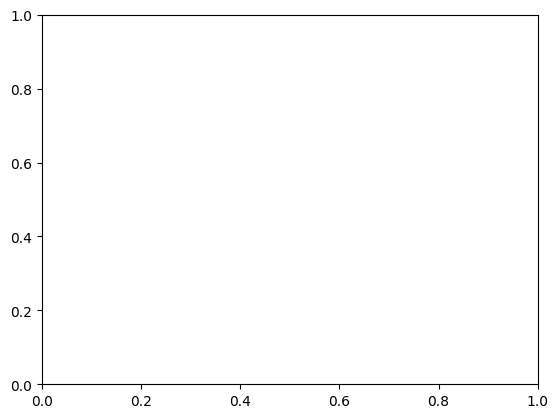

KeyError: 115

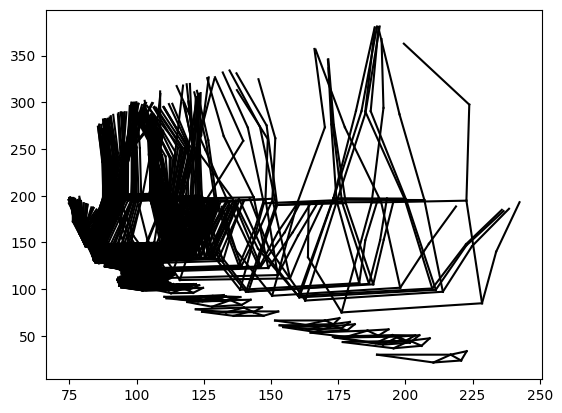

In [18]:
from functools import partial
from matplotlib.animation import FFMpegWriter
# %matplotlib widget

# GENERATE ANIMATIONS 

fig, ax = plt.subplots()
width, height = 640, 480

coral_df = coral_df1
# vid_title = file_titles[i] + '.mp4'
# coral_df = c1_df.copy()
times = coral_df['time_int'].unique()
# ani = FuncAnimation(fig, animate, interval=10)
ani = FuncAnimation(fig, partial(animate3, coral_df=coral_df, fig=fig, ax=ax), frames=len(times)-1, init_func=init)
# ani = FuncAnimation(fig, partial(animate2, coral_df=coral_df, fig=fig, ax=ax), interval=len(coral_df)-3, save_count=len(coral_df)-3, repeat=False)
plt.show()

# save animation:
writervideo = FFMpegWriter(fps=20)
ani.save('keypoint_files/visualizations/test/test.mp4', writer=writervideo)

In [30]:
times

array([45.925     , 45.92526139, 45.92552278, ..., 46.27447722,
       46.27473861, 46.275     ])

In [1]:
pose = coral_df.iloc[0]

for i in range(10):
    pose = coral_df.iloc[i]
    width, height = 640, 480
    all_x_coords, all_y_coords, probs = [], [], []
    x_coords, y_coords = [], []

    for kp in keypoints:
        all_x_coords.append(pose[kp][0])
        all_y_coords.append(pose[kp][1])
        probs.append(pose[kp][2])

        x_coords.append(pose[kp][0])
        y_coords.append(pose[kp][1])

    fig, ax = plt.subplots()
    ax.scatter(x=x_coords, y=y_coords)
    for i,j in num_edges:
        # if probs[i] > detection_threshold and probs[j] > detection_threshold:
        xs, ys = [all_x_coords[i], all_x_coords[j]], [all_y_coords[i], all_y_coords[j]]
        plt.plot(xs, ys, color='black')

    ax.set_xlim([0, width])
    ax.set_ylim([height, 0])

plt.show()





NameError: name 'coral_df' is not defined

In [21]:
coral_df['frame'] = coral_df['NOSE'].apply(lambda row: row[-1])

In [27]:
for var in keypoints:
    coral_df[f'{var}_X'] = coral_df[var].apply(lambda row: row[0])
    coral_df[f'{var}_Y'] = coral_df[var].apply(lambda row: row[1])

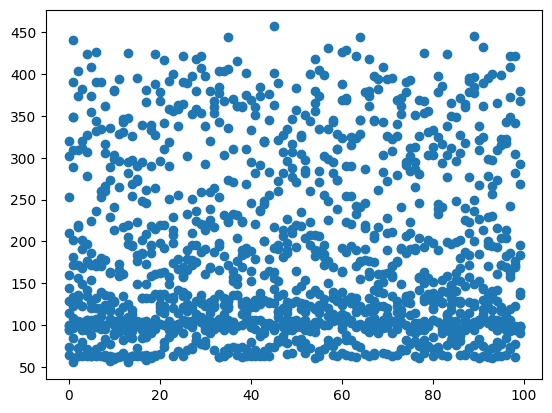

In [29]:
plt.scatter(coral_df['frame'], coral_df['NOSE_X'])

In [47]:
frame_list = coral_df['frame'].tolist()
print(max(frame_list), min(frame_list))

test = list(coral_df['frame'] == 2)
print(len(test))

99 0
1340


In [56]:
# clean_coral_df = coral_df.drop_duplicates(subset=['frame'], inplace=True)
clean_coral_df = coral_df.sort_values(by=['frame']).drop_duplicates(subset=['frame'])

In [57]:
clean_coral_df

,NOSE,LEFT_EYE,RIGHT_EYE,LEFT_EAR,RIGHT_EAR,LEFT_SHOULDER,RIGHT_SHOULDER,LEFT_ELBOW,RIGHT_ELBOW,LEFT_WRIST,...,RIGHT_THORAX_X,RIGHT_THORAX_Y,THORAX_X,THORAX_Y,HEAD_X,HEAD_Y,TRUNK_X,TRUNK_Y,COM_X,COM_Y
0,"[114.43137, 103.45098, 0.99529284, 0]","[116.2841, 100.159096, 0.9882053, 0]","[108.29541, 100.03151, 0.988361, 0]","[121.00398, 104.832436, 0.636603, 0]","[101.14185, 103.8518, 0.92813164, 0]","[127.536705, 133.31349, 0.99739194, 0]","[92.540085, 128.29953, 0.99741036, 0]","[132.70135, 165.84723, 0.9943997, 0]","[81.201256, 158.6325, 0.99711096, 0]","[136.92642, 194.29015, 0.9842126, 0]",...,95.974858,162.263725,110.568780,164.476940,114.431370,103.450980,110.568780,164.476940,110.923887,172.594566
1,"[108.15686, 103.45098, 0.99559456, 1]","[113.126465, 99.5659, 0.98455644, 1]","[103.79879, 99.04016, 0.9936667, 1]","[117.8008, 104.90002, 0.72335327, 1]","[96.044464, 102.97757, 0.9597609, 1]","[123.52777, 133.76845, 0.9971631, 1]","[87.22049, 128.33432, 0.9974003, 1]","[127.832214, 165.30693, 0.99472827, 1]","[79.31042, 159.94135, 0.99721515, 1]","[133.48882, 194.75917, 0.9754725, 1]",...,92.591520,161.525970,106.984212,163.479908,108.156860,103.450980,106.984212,163.479908,107.582722,171.352222
2,"[105.333336, 107.37255, 0.9971533, 2]","[109.249886, 103.45618, 0.98689437, 2]","[100.51898, 103.04458, 0.99531496, 2]","[111.82671, 107.310486, 0.522581, 2]","[93.60831, 105.600746, 0.9459745, 2]","[119.224495, 134.32248, 0.99742585, 2]","[84.25957, 132.10043, 0.99712914, 2]","[125.88561, 166.31534, 0.99080527, 2]","[80.22973, 165.63866, 0.99616003, 2]","[129.48671, 194.90141, 0.9889207, 2]",...,89.518115,164.815395,102.853524,165.532488,105.333336,107.372550,102.853524,165.532488,103.412548,173.411897
3,"[104.15686, 124.15686, 0.99507, 3]","[106.918205, 120.529106, 0.98121876, 3]","[99.50071, 119.59647, 0.9907094, 3]","[109.320885, 123.06332, 0.5090741, 3]","[93.319374, 121.59912, 0.9267335, 3]","[114.19222, 146.04301, 0.99717087, 3]","[84.087944, 143.26927, 0.9968209, 3]","[119.484764, 173.98239, 0.9906653, 3]","[80.43904, 170.78188, 0.9929744, 3]","[121.94257, 197.54558, 0.9858496, 3]",...,86.889195,170.045175,99.014062,170.990653,104.156860,124.156860,99.014062,170.990653,99.222459,177.331419
4,"[105.803925, 117.09804, 0.99479055, 4]","[109.93468, 113.5445, 0.9675931, 4]","[102.580444, 113.19721, 0.98440117, 4]","[114.11359, 116.5213, 0.62089074, 4]","[95.692535, 114.22622, 0.8874901, 4]","[118.78537, 141.63936, 0.9970976, 4]","[84.57646, 138.59593, 0.99722856, 4]","[123.27999, 169.80229, 0.99097615, 4]","[79.84572, 168.20908, 0.99572456, 4]","[127.63775, 194.8096, 0.99009573, 4]",...,87.702922,168.677680,100.999243,169.936245,105.803925,117.098040,100.999243,169.936245,101.160050,176.746995
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95,"[105.411766, 116.70588, 0.9953708, 95]","[109.51917, 112.822334, 0.9750435, 95]","[102.18189, 112.8442, 0.9870336, 95]","[113.8071, 116.368904, 0.59160286, 95]","[95.176834, 113.8817, 0.9048334, 95]","[119.73755, 141.89903, 0.9971667, 95]","[84.919174, 139.33788, 0.9970011, 95]","[125.5749, 169.79393, 0.991037, 95]","[80.06911, 169.97359, 0.9946077, 95]","[128.72551, 193.92928, 0.9884979, 95]",...,89.190977,169.583200,102.420751,170.587535,105.411766,116.705880,102.420751,170.587535,102.500467,177.155803
96,"[105.411766, 116.70588, 0.9952799, 96]","[109.14678, 112.81259, 0.97481537, 96]","[102.16859, 112.83674, 0.9864559, 96]","[113.89615, 116.362434, 0.6088117, 96]","[95.206825, 114.21353, 0.8983525, 96]","[119.75787, 142.06161, 0.99718326, 96]","[85.0304, 139.33932, 0.9970867, 96]","[125.155495, 169.93976, 0.991032, 96]","[79.927635, 169.67873, 0.995331, 96]","[128.39252, 194.21169, 0.987944, 96]",...,88.923910,169.312490,102.207545,170.437235,105.411766,116.705880,102.207545,170.437235,102.257351,177.075497
97,"[106.588234, 103.45098, 0.99600667, 97]","[111.9257, 98.82733, 0.9831231, 97]","[102.243225, 98.81404, 0.9926898, 97]","[115.794205, 104.5

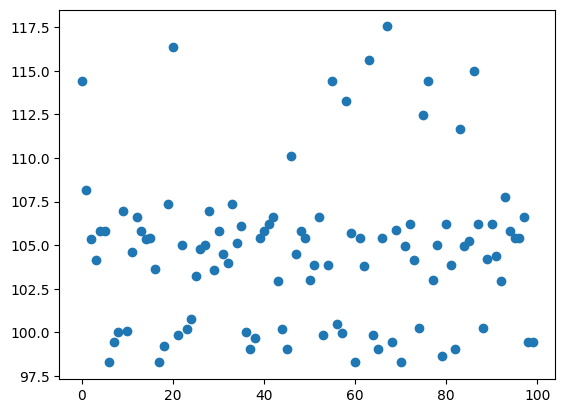

In [58]:
plt.scatter(clean_coral_df['frame'], clean_coral_df['NOSE_X'])

In [84]:
keypoints

['NOSE',
 'LEFT_EYE',
 'RIGHT_EYE',
 'LEFT_EAR',
 'RIGHT_EAR',
 'LEFT_SHOULDER',
 'RIGHT_SHOULDER',
 'LEFT_ELBOW',
 'RIGHT_ELBOW',
 'LEFT_WRIST',
 'RIGHT_WRIST',
 'LEFT_HIP',
 'RIGHT_HIP',
 'LEFT_KNEE',
 'RIGHT_KNEE',
 'LEFT_ANKLE',
 'RIGHT_ANKLE']

In [88]:
def create_df_from_hour(hourdir):

    def create_df(file):
        print(file)
        raw_df = pd.read_csv(file)
#         print(raw_df)
        f_df = pd.DataFrame(columns=keypoints.append('images'))
        for kp in keypoints:
            f_df[kp] = literal_eval(raw_df[kp][0])
        
        return f_df
            
    data_files = [file for file in listdir(hourdir) if '.csv' in file] 
    print("DATA FILES", data_files)
    data_files.sort()

    df_full = create_df(data_files[0])
    for f in data_files[1:]:
        df_new = create_df(f)
        df_full = pd.concat([df_full, df_new])
            
    return df_full

In [100]:
keypoints = ['NOSE',
 'LEFT_EYE',
 'RIGHT_EYE',
 'LEFT_EAR',
 'RIGHT_EAR',
 'LEFT_SHOULDER',
 'RIGHT_SHOULDER',
 'LEFT_ELBOW',
 'RIGHT_ELBOW',
 'LEFT_WRIST',
 'RIGHT_WRIST',
 'LEFT_HIP',
 'RIGHT_HIP',
 'LEFT_KNEE',
 'RIGHT_KNEE',
 'LEFT_ANKLE',
 'RIGHT_ANKLE']

In [160]:
def create_df_from_file(file):
    print(file)
    raw_df = pd.read_csv(file)
#         print(raw_df)
    f_df = pd.DataFrame(columns=keypoints, dtype=np.int64)
    for kp in keypoints:
        f_df[kp] = literal_eval(raw_df[kp][0])

    return f_df

def create_df_from_folder(folder):
    files = [file for file in listdir(folder) if '.csv' in file]
    files.sort()
    print(files)

    df_full = create_df_from_file(files[0])

    if len(files)>1:
        for i in range(len(files)-1):
            df_new = create_df_from_file(files[i+1])
            df_full = pd.concat([df_full, df_new])
        
    return df_full

# test_file = 'keypoint_files/tuned_goose/2023/05/15/20/2023-05-15_20:35:31.csv'
# test_file = 'keypoint_files/tuned_goose/2023/05/15/20'
# t_file = 'keypoint_files/coral_kps/rec1_crop/images_00.csv'
t_file = 'keypoint_files/test_dfs/images_01.csv'
t_folder = 'keypoint_files/test_dfs'
# test_file = 'keypoint_files/test_dfs/videos_for_coral_coral_results_rec3_crop_images_00.csv'
# test_df = create_df_from_hour(test_file)
# test_df = pd.read_csv(test_file)
# t_file = create_df_from_file(t_file)
t_file = create_df_from_folder(t_folder)

# time_int = [45 + (55.0/60), 46+(14.9/60)]
# coral_df1 = 'keypoint_files/coral_kps/rec1_crop'
# coral_df1 = create_df_from_hour(coral_df1)
# coral_df1 = add_times(coral_df1, time_int)

['keypoint_files/test_dfs/images_00.csv', 'keypoint_files/test_dfs/images_01.csv', 'keypoint_files/test_dfs/images_02.csv']
keypoint_files/test_dfs/images_00.csv
keypoint_files/test_dfs/images_01.csv
keypoint_files/test_dfs/images_02.csv


In [161]:
t_file

,NOSE,LEFT_EYE,RIGHT_EYE,LEFT_EAR,RIGHT_EAR,LEFT_SHOULDER,RIGHT_SHOULDER,LEFT_ELBOW,RIGHT_ELBOW,LEFT_WRIST,RIGHT_WRIST,LEFT_HIP,RIGHT_HIP,LEFT_KNEE,RIGHT_KNEE,LEFT_ANKLE,RIGHT_ANKLE
0,"[304.86273, 100.70588, 0.9949409, 0, image_95....","[309.52884, 96.92229, 0.9925688, 0, image_95.png]","[298.56046, 96.402504, 0.99070567, 0, image_95...","[317.4907, 102.49751, 0.89756274, 0, image_95....","[291.76392, 101.72502, 0.8753319, 0, image_95....","[331.59033, 141.7402, 0.9970331, 0, image_95.png]","[281.45764, 141.7192, 0.9973666, 0, image_95.png]","[343.57632, 186.15012, 0.99464273, 0, image_95...","[273.3338, 190.58206, 0.9965701, 0, image_95.png]","[346.15152, 224.78387, 0.973961, 0, image_95.png]","[269.15814, 238.75809, 0.9717467, 0, image_95....","[322.30093, 235.8243, 0.9750733, 0, image_95.png]","[290.54224, 236.87329, 0.99054986, 0, image_95...","[320.2001, 323.4013, 0.99393255, 0, image_95.png]","[295.19116, 322.47693, 0.9902063, 0, image_95....","[316.56873, 377.86795, 0.91486055, 0, image_95...","[298.0955, 393.6463, 0.8417539, 0, image_95.png]"
1,"[308.09302, 107.68579, 0.99737144, 1, image_88...","[313.82065, 102.85312, 0.9969253, 1, image_88....","[303.29413, 100.70588, 0.9918292, 1, image_88....","[319.87485, 108.7115, 0.8410774, 1, image_88.png]","[295.53503, 106.733284, 0.90291476, 1, image_8...","[331.65106, 143.23451, 0.99733067, 1, image_88...","[286.33157, 143.43668, 0.9973564, 1, image_88....","[342.81842, 188.34134, 0.9952068, 1, image_88....","[278.1748, 188.62453, 0.99726665, 1, image_88....","[342.9297, 225.38214, 0.9777139, 1, image_88.png]","[272.78363, 231.56255, 0.9838345, 1, image_88....","[323.3478, 232.52975, 0.9778791, 1, image_88.png]","[292.37198, 230.79816, 0.9930824, 1, image_88....","[316.6408, 307.55194, 0.9800101, 1, image_88.png]","[294.0023, 306.75708, 0.9795735, 1, image_88.png]","[314.3065, 378.2588, 0.8896062, 1, image_88.png]","[298.9108, 378.01114, 0.913836, 1, image_88.png]"
2,"[302.90195, 124.54902, 0.9946641, 2, image_76....","[306.80472, 120.26848, 0.99301094, 2, image_76...","[298.13248, 120.693375, 0.99229103, 2, image_7...","[314.6023, 124.64705, 0.9228537, 2, image_76.png]","[291.4179, 125.90389, 0.85149276, 2, image_76....","[323.8487, 155.60927, 0.9973634, 2, image_76.png]","[284.46103, 154.4088, 0.9968947, 2, image_76.png]","[328.96082, 191.34306, 0.98883235, 2, image_76...","[276.3972, 191.8787, 0.99745375, 2, image_76.png]","[335.8294, 229.83571, 0.9652262, 2, image_76.png]","[275.43787, 220.548, 0.99496704, 2, image_76.png]","[317.64383, 231.69841, 0.9896305, 2, image_76....","[292.5252, 229.916, 0.99484754, 2, image_76.png]","[316.09122, 300.23907, 0.9903826, 2, image_76....","[298.01147, 301.77872, 0.9862509, 2, image_76....","[316.17834, 362.20358, 0.9559326, 2, image_76....","[297.90778, 358.53906, 0.94416845, 2, image_76..."
3,"[309.56818, 150.36725, 0.99467176, 3, image_38...","[313.37717, 146.7264, 0.98666465, 3, image_38....","[306.34552, 146.64066, 0.97126234, 3, image_38...","[319.51102, 149.89204, 0.83687097, 3, image_38...","[301.79907, 149.44055, 0.76220536, 3, image_38...","[326.66666, 172.54903, 0.9973596, 3, image_38....","[296.8436, 172.58643, 0.99663275, 3, image_38....","[333.20047, 199.52165, 0.9831693, 3, image_38....","[293.8884, 201.34615, 0.9879276, 3, image_38.png]","[336.48706, 219.64374, 0.9746232, 3, image_38....","[288.12442, 229.08366, 0.9725026, 3, image_38....","[320.26157, 227.62196, 0.99705434, 3, image_38...","[305.39172, 228.29, 0.9970726, 3, image_38.png]","[321.79337, 269.5723, 0.9952291, 3, image_38.png]","[309.93808, 271.15637, 0.988456, 3, image_38.png]","[311.26898, 318.68167, 0.95533365, 3, image_38...","[316.39703, 318.1531, 0.9624492, 3, image_38.png]"
4,"[312.2106, 143.79747, 0.99255365, 4, image_51....","[315.7792, 139.73581, 0.96895254, 4, image_51....","[308.0, 139.67296, 0.98763436, 4, image_51.png]","[319.25467, 142.93114, 0.4982503, 4, image_51....","[301.12082, 142.87694, 0.9213757, 4, image_51....","[325.84714, 169.138

In [162]:
t_file['frame'] = t_file['NOSE'].apply(lambda row: row[-2])
t_file['image'] = t_file['NOSE'].apply(lambda row: int((row[-1].split('_')[1]).split(".")[0]))


In [163]:
list(t_file['image'])

[95,
 88,
 76,
 38,
 51,
 56,
 21,
 27,
 9,
 63,
 34,
 1,
 79,
 52,
 75,
 48,
 39,
 22,
 12,
 82,
 98,
 13,
 49,
 32,
 7,
 36,
 69,
 58,
 67,
 3,
 3,
 55,
 44,
 40,
 87,
 68,
 72,
 11,
 18,
 14,
 59,
 77,
 81,
 85,
 5,
 33,
 25,
 89,
 42,
 54,
 53,
 4,
 46,
 64,
 30,
 66,
 93,
 8,
 10,
 92,
 74,
 23,
 57,
 2,
 97,
 16,
 19,
 61,
 99,
 26,
 73,
 24,
 71,
 80,
 37,
 15,
 91,
 94,
 35,
 50,
 20,
 84,
 45,
 29,
 90,
 70,
 0,
 96,
 65,
 31,
 43,
 47,
 41,
 6,
 83,
 78,
 62,
 60,
 86,
 17,
 28,
 117,
 165,
 198,
 189,
 143,
 175,
 161,
 137,
 108,
 110,
 120,
 166,
 129,
 187,
 184,
 184,
 172,
 172,
 126,
 194,
 199,
 130,
 133,
 131,
 127,
 193,
 170,
 154,
 100,
 185,
 121,
 176,
 157,
 160,
 123,
 159,
 107,
 116,
 152,
 168,
 173,
 105,
 101,
 122,
 135,
 188,
 112,
 158,
 150,
 192,
 113,
 197,
 182,
 146,
 111,
 132,
 180,
 134,
 186,
 167,
 124,
 118,
 181,
 177,
 183,
 106,
 153,
 169,
 102,
 140,
 144,
 103,
 195,
 162,
 119,
 148,
 115,
 196,
 178,
 142,
 128,
 125,
 149,
 179,
 1

In [164]:
t_file.sort_values('image')

,NOSE,LEFT_EYE,RIGHT_EYE,LEFT_EAR,RIGHT_EAR,LEFT_SHOULDER,RIGHT_SHOULDER,LEFT_ELBOW,RIGHT_ELBOW,LEFT_WRIST,RIGHT_WRIST,LEFT_HIP,RIGHT_HIP,LEFT_KNEE,RIGHT_KNEE,LEFT_ANKLE,RIGHT_ANKLE,frame,image
86,"[331.33218, 162.02328, 0.9711662, 85, image_0....","[334.19366, 159.29922, 0.87783474, 85, image_0...","[329.5166, 159.3979, 0.9048778, 85, image_0.png]","[337.5297, 161.17073, 0.63684803, 85, image_0....","[324.8552, 161.65805, 0.71821505, 85, image_0....","[343.05884, 181.41176, 0.99649304, 85, image_0...","[318.2955, 180.04802, 0.994208, 85, image_0.png]","[348.7603, 204.98326, 0.98134226, 85, image_0....","[312.90417, 203.58745, 0.9483667, 85, image_0....","[351.41705, 226.09705, 0.9779158, 85, image_0....","[308.40463, 226.3884, 0.87872183, 85, image_0....","[336.91974, 228.8676, 0.9972408, 85, image_0.png]","[321.00394, 228.19994, 0.997335, 85, image_0.png]","[338.09985, 266.41333, 0.9931265, 85, image_0....","[321.40692, 267.00244, 0.9919723, 85, image_0....","[319.7898, 303.55826, 0.9721904, 85, image_0.png]","[333.1046, 303.2633, 0.97518414, 85, image_0.png]",85,0
11,"[330.54974, 162.60466, 0.9846049, 11, image_1....","[333.07025, 159.71758, 0.9143357, 11, image_1....","[328.0, 159.81395, 0.94729596, 11, image_1.png]","[336.70734, 161.19867, 0.5653729, 11, image_1....","[322.67868, 162.08385, 0.76176876, 11, image_1...","[341.88235, 181.0196, 0.9964708, 11, image_1.png]","[317.33997, 180.61499, 0.99419254, 11, image_1...","[348.08002, 204.27002, 0.97993785, 11, image_1...","[312.0001, 204.19057, 0.9588922, 11, image_1.png]","[350.71387, 225.74034, 0.9770025, 11, image_1....","[308.44095, 226.57437, 0.90841365, 11, image_1...","[335.6608, 229.21924, 0.9973937, 11, image_1.png]","[320.26624, 228.27626, 0.9974164, 11, image_1....","[337.87006, 266.53433, 0.9908049, 11, image_1....","[320.27493, 266.18335, 0.9915535, 11, image_1....","[317.62198, 303.2446, 0.96580017, 11, image_1....","[336.3168, 302.7736, 0.9710317, 11, image_1.png]",11,1
63,"[329.76645, 161.48837, 0.9852852, 62, image_2....","[332.39978, 158.38583, 0.9312681, 62, image_2....","[326.9582, 158.88483, 0.96204, 62, image_2.png]","[335.58853, 160.05006, 0.48916978, 62, image_2...","[321.34286, 161.31331, 0.7845135, 62, image_2....","[341.09805, 179.92157, 0.9967817, 62, image_2....","[316.0507, 179.99646, 0.9952691, 62, image_2.png]","[347.22693, 203.08284, 0.9763291, 62, image_2....","[310.95288, 204.01811, 0.953532, 62, image_2.png]","[350.48276, 223.92274, 0.97663444, 62, image_2...","[307.70062, 226.82231, 0.87406474, 62, image_2...","[334.97995, 228.8567, 0.99731535, 62, image_2....","[319.37604, 227.99608, 0.99733186, 62, image_2...","[337.78983, 265.70847, 0.9957397, 62, image_2....","[318.5278, 265.3209, 0.9919451, 62, image_2.png]","[323.4038, 300.8463, 0.9518555, 62, image_2.png]","[323.5729, 301.2169, 0.95811445, 62, image_2.png]",62,2
29,"[328.43042, 162.34004, 0.9879709, 29, image_3....","[331.2816, 159.03865, 0.933595, 29, image_3.png]","[325.47318, 159.25291, 0.955827, 29, image_3.png]","[334.69305, 160.62238, 0.51463366, 29, image_3...","[320.08487, 161.77295, 0.7596022, 29, image_3....","[339.52942, 181.09804, 0.99712855, 29, image_3...","[314.2297, 181.29428, 0.99489516, 29, image_3....","[346.84665, 204.73238, 0.9846421, 29, image_3....","[309.27075, 206.27837, 0.95259815, 29, image_3...","[350.0695, 225.51434, 0.9832857, 29, image_3.png]","[306.79163, 228.67882, 0.87795264, 29, image_3...","[334.47382, 230.19301, 0.9972199, 29, image_3....","[318.40445, 228.72444, 0.9971499, 29, image_3....","[336.96997, 268.1708, 0.99431324, 29, image_3....","[318.9533, 267.4861, 0.9897748, 29, image_3.png]","[320.49634, 303.5125, 0.9635425, 29, image_3.png]","[331.77417, 303.41928, 0.96790254, 29, image_3...",29,3
30,"[124.63254, 223.54953, 0.08086349, 29, image_3...","[124.120605, 221.32797, 0.085192814, 29, image...","[122.81296, 221.7578, 0.076405324, 29, image_3...","[123.96306, 221.15244, 0.08946, 29, image_3.png]","[119.524506, 221.91835, 0.054337442, 2

In [173]:
t_list = list(t_file['image'])
t_list.sort()
t_list

[0,
 1,
 2,
 3,
 3,
 4,
 5,
 6,
 7,
 8,
 9,
 10,
 11,
 12,
 13,
 14,
 15,
 16,
 17,
 18,
 19,
 20,
 21,
 22,
 23,
 24,
 25,
 26,
 27,
 28,
 29,
 30,
 31,
 32,
 33,
 34,
 35,
 36,
 37,
 38,
 39,
 40,
 41,
 42,
 43,
 44,
 45,
 46,
 47,
 48,
 49,
 50,
 51,
 52,
 53,
 54,
 55,
 56,
 57,
 58,
 59,
 60,
 61,
 62,
 63,
 64,
 65,
 66,
 67,
 68,
 69,
 70,
 71,
 72,
 73,
 74,
 75,
 76,
 77,
 78,
 79,
 80,
 81,
 82,
 83,
 84,
 85,
 86,
 87,
 88,
 89,
 90,
 91,
 92,
 93,
 94,
 95,
 96,
 97,
 98,
 99,
 100,
 101,
 102,
 103,
 104,
 105,
 106,
 107,
 108,
 109,
 110,
 111,
 112,
 113,
 114,
 115,
 116,
 117,
 118,
 119,
 120,
 121,
 122,
 123,
 124,
 125,
 126,
 127,
 128,
 129,
 130,
 131,
 132,
 133,
 134,
 135,
 136,
 137,
 138,
 139,
 140,
 141,
 142,
 143,
 144,
 145,
 146,
 147,
 148,
 149,
 150,
 151,
 152,
 153,
 154,
 155,
 156,
 157,
 158,
 159,
 160,
 161,
 162,
 163,
 164,
 165,
 166,
 167,
 168,
 169,
 170,
 171,
 172,
 172,
 173,
 174,
 175,
 176,
 177,
 178,
 179,
 180,
 181,
 182,
 1

In [174]:
# test_df['time'] = test_df['NOSE'].apply(lambda row: float(str.split(row[-1], ':')[-1]))

for kp in keypoints:
    t_file[f'{kp}_X'] = t_file[kp].apply(lambda row: row[0])
    t_file[f'{kp}_Y'] = t_file[kp].apply(lambda row: row[1])

(0.0, 640.0)

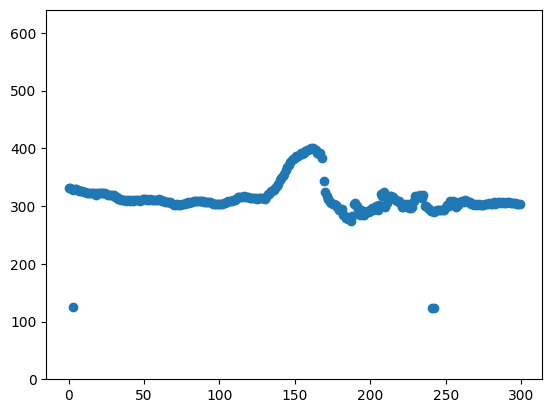

In [175]:
plt.scatter(t_file['image'], t_file['NOSE_X'])
plt.ylim([0, 640]) # for x values
# plt.ylim([480, 0])